In [1]:
import os
import gc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
path = './../../RQ2/'

file_corr = 'README_post.csv'
file_window_corr = 'README_local_error.csv'
file_stat = 'README_post_mean_std.csv'

# Option-Wise vs Option-Wise Window Correlation

In [3]:
df_corr = pd.read_csv(os.path.join(path, file_corr))
#df_corr.loc[(df_corr['CaseStudy'] == '7z') & (df_corr['WindowMin'] == '4.20')]
df_corr

,CaseStudy,WindowMin,WindowMax,Option,Value,Configurations,Pearson-Correlation,Group
0,7z,-,-,filterOff,0,34320,0.988,filterOff
1,7z,-,-,filterOff,1,34320,0.989,filterOff
2,7z,4.20,46.23,filterOff,0,20396,0.923,filterOff
3,7z,4.20,46.23,filterOff,1,20396,0.922,filterOff
4,7z,25.22,67.25,filterOff,0,6332,0.585,filterOff
...,...,...,...,...,...,...,...,...
4663,x264,21.56,38.98,core4,1,804,0.991,core
4664,x264,30.27,47.69,core4,1,610,0.978,core
4665,x264,38.98,56.40,core4,1,346,0.933,core
4666,x264,47.69,65.11,core4,1,105,0.719,core


Study: 7z
487 43


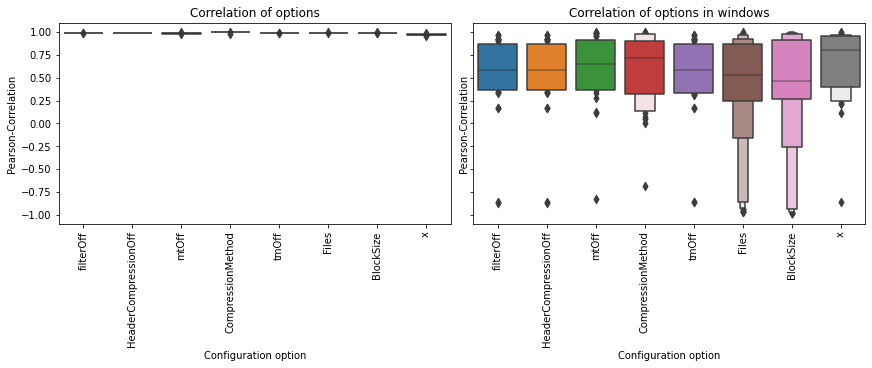

out


[['7z', 0.9867573135198134, 33, 5, 86, 156, 207]]

In [4]:
correlation_res = []
correlation_res_mean = []

for study, df in df_corr.groupby(['CaseStudy']):
    print('Study:', study)
    # break
    
    mask = df['WindowMin'] == '-'
    
    df_windows = df[~mask]
    df_all = df[mask]
    
    print(len(df_windows), len(df_all))
    
    fig1, axes = plt.subplots(ncols=2, nrows=1, constrained_layout=True, sharey=True, figsize=(12,5))
    
    #color_column = 'Option' if len(df_all.Option.unique()) > 1 else 'Value'
    sns.boxenplot(x="Group", y="Pearson-Correlation", data=df_all, ax=axes[0])
    axes[0].set_title('Correlation of options')
    axes[0].tick_params(axis='x', rotation=90)
    axes[0].set_xlabel('Configuration option')
    axes[0].set_ylim(-1.1, 1.1)
    
    sns.boxenplot(x="Group", y="Pearson-Correlation", data=df_windows, ax=axes[1])
    axes[1].set_title('Correlation of options in windows')
    axes[1].tick_params(axis='x', rotation=90)
    axes[1].set_xlabel('Configuration option')
    
    arr1 = []
    opt_whole_corr = []
    for option, sub_df in df_all.groupby(['Group']):
        arr1.append([study, option, 
                     sub_df['Pearson-Correlation'].mean(), 
                     sub_df['Pearson-Correlation'].std(), 
                     sub_df['Pearson-Correlation'].quantile(.75), 
                     sub_df['Pearson-Correlation'].quantile(.25)])
        
        opt_whole_corr.append(sub_df['Pearson-Correlation'].mean())
        
    left = pd.DataFrame(arr1, columns=['system', 'Option', 'Mean', 'StD', 
                                      'Quantile .25', 'Quantile .75'])
    opt_whole_corr_df = pd.DataFrame(opt_whole_corr, columns=['corr'])

    arr2 = []
    opt_window_corr = []
    for option, sub_df in df_windows.groupby(['Group']):
        arr2.append([study, option,
                     sub_df['Pearson-Correlation'].mean(), 
                     sub_df['Pearson-Correlation'].std(), 
                     sub_df['Pearson-Correlation'].quantile(.75), 
                     sub_df['Pearson-Correlation'].quantile(.25)])
        
        opt_window_corr.append(sub_df['Pearson-Correlation'].tolist())
    opt_window_corr_out = []
    for l in opt_window_corr:
        opt_window_corr_out = opt_window_corr_out + l
    #print(opt_window_corr_out)
    opt_window_corr_df = pd.DataFrame(opt_window_corr_out, columns=['corr'])
        
    right = pd.DataFrame(arr2, columns=['system', 'Option', 'WD Mean', 'WD StD', 
                                      'WD Quantile .25', 'WD Quantile .75'])
    
    # Correlation Windows
    # Thresolds: 0.914, 0.918, 0.957, 0.959, 0.968, 0.983, 0.866, 0.461, 0.455, 0.455, 0.804, 0.472, 0.458, 0.459, 0.522, 0.735, 0.955, 0.455, 0.46, 0.982, 0.953, 0.973, 0.971, 0.973, 0.973, 0.973, 0.974, 0.973, 0.946, 0.998, 0.979, 0.979, 0.886, 0.928, 0.772, 0.852, 0.746, 0.877, 0.768, 0.774, 0.767, 0.769, 0.77, 0.763, 0.768, 0.575, 0.574, 0.579, 0.574, 0.576, 0.574, 0.585, 0.574, 0.628, 0.987, 0.976, 0.954, 0.905, 0.901, -0.255, -0.26, -0.258, -0.256, -0.256, -0.26, -0.23, -0.13, 0.948, 0.184, 0.894, 0.921, 0.999, 0.999, 0.999, 0.999, 0.999, 0.998, 0.999, 0.868, 0.998, 0.187, 0.239, 0.976, 0.999, 0.484, 0.469, 0.403, 0.403, 0.549, -0.092, 0.558, 0.391, 0.825, 0.035, 0.359, -0.264, -0.006, 0.706, -0.344, -0.052, 0.461, -0.867, -0.976, -0.979, -0.976, -0.975, -0.975, -0.934, -0.961, -0.98, -0.962, -0.91, -0.971, -0.973, 0.307, 0.395, 0.428, 0.348, 0.392, 0.364, 0.29, 0.272, 0.494, 0.328, 0.37, 0.349, 0.204, 0.371, 0.339, 0.366, 0.082, 0.199, 0.462, 0.267, 0.409, 0.333, 0.207, 0.334, 0.282, 0.359, 0.296, 0.182, 0.406, 0.258, 0.42, 0.347, 0.338, 0.149, 0.415, 0.231, 0.284, -0.008, 0.194] (-1) : (-0.7) : (-0.3) : 0.3 : 0.7 : 1
    # Strong N : Moderate N : Weak/None : Moderate P : Strong P
    bins = [-1, -0.7, -0.3, 0.3, 0.7, 1]
    
    correlation_res_mean.append([study, opt_whole_corr_df['corr'].mean()]+
                                list(opt_window_corr_df['corr'].value_counts(bins=bins, sort=False)))
    
    df_out = pd.merge(left, right, on=["system", "Option"])
    correlation_res.append(df_out)
    
        
    plt.show()
    break
    
corr_res_df = pd.concat(correlation_res)
#df_all
print('out')
correlation_res_mean

# Local Error

In [5]:
df_error = pd.read_csv(os.path.join(path, file_window_corr))
print(list(df_error))
df_error

['CaseStudy', 'WindowMin', 'WindowMax', 'Option', 'Value', 'LocalRegressionErrorAbs', 'LocalRegressionError', 'GlobalRegressionErrorAbs', 'GlobalRegressionError', 'Group']


,CaseStudy,WindowMin,WindowMax,Option,Value,LocalRegressionErrorAbs,LocalRegressionError,GlobalRegressionErrorAbs,GlobalRegressionError,Group
0,7z,-,-,filterOff,0,0.11,19.12,-,-,filterOff
1,7z,-,-,filterOff,0,0.11,19.39,-,-,filterOff
2,7z,-,-,filterOff,0,0.09,15.48,-,-,filterOff
3,7z,-,-,filterOff,0,0.12,21.46,-,-,filterOff
4,7z,-,-,filterOff,0,0.09,15.37,-,-,filterOff
...,...,...,...,...,...,...,...,...,...,...
3462615,x264,-,-,core4,1,0.12,5.75,-,-,core
3462616,x264,-,-,core4,1,0.00,0.10,-,-,core
3462617,x264,-,-,core4,1,0.07,5.40,-,-,core
3462618,x264,-,-,core4,1,0.02,0.96,-,-,core


In [6]:
mean_model_error = []
model_quality = df_error[['CaseStudy', 'Group', 'Option', 'Value', 'LocalRegressionErrorAbs', 'LocalRegressionError']]
for system, sub_df in model_quality.groupby(['CaseStudy']):
    print(system)
    if system != 'x264':
        continue
    for opt_val, reg_err_df in sub_df.groupby(['Option', 'Value']):
        opt, val = opt_val
        #print(reg_err_df['LocalRegressionError'].mean(), opt, '(', val,')', len(reg_err_df))
        
        mean_model_error.append([system, opt, val, len(reg_err_df), reg_err_df['LocalRegressionError'].mean()])

mean_model_error_df = pd.DataFrame(mean_model_error, columns=['CaseStudy', 'Option', 'Value', 'NumberCfgs', 'ModelError'])

mean_model_error_df.sort_values(by=['ModelError'])

7z
Apache
HSQLDB
LLVM
MongoDB
PostgreSQL
VP8
brotli
exastencils
jump3r
kanzi
lrzip
nginx
x264


,CaseStudy,Option,Value,NumberCfgs,ModelError
1,x264,core2,1,1152,2.446016
0,x264,core1,1,1152,2.480451
2,x264,core3,1,1152,2.484002
3,x264,core4,1,1152,2.728681
21,x264,ref_1,1,1536,3.090553
22,x264,ref_5,1,1536,3.737454
23,x264,ref_9,1,1536,4.668021
15,x264,no_mixed_refs,1,2304,9.252405
10,x264,no_fast_pskip,0,2304,9.863394
18,x264,rc_lookahead_20,1,1536,10.038411


7z


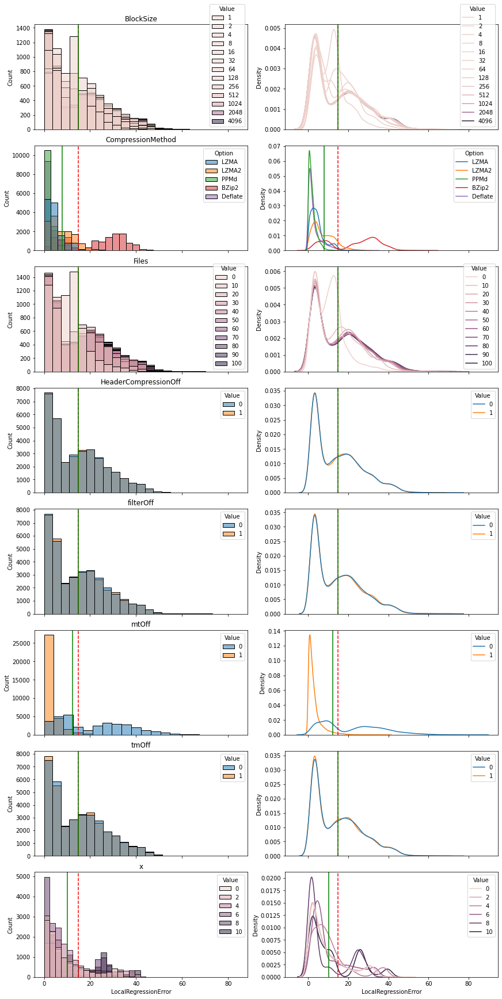

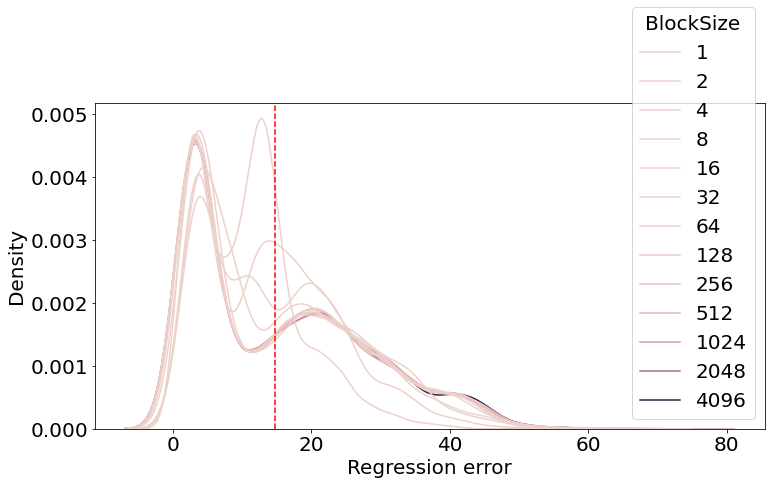

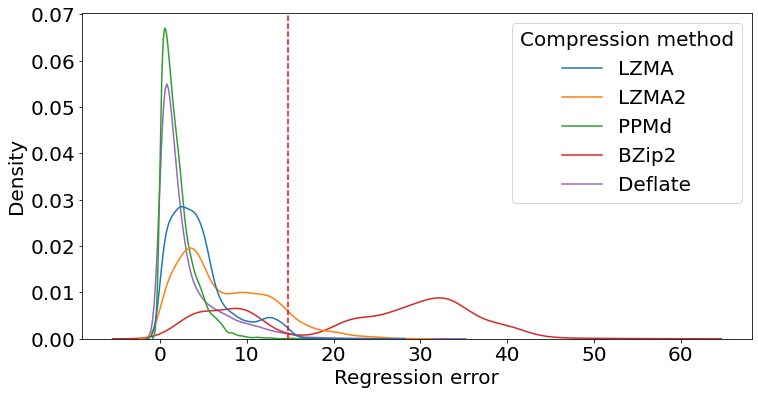

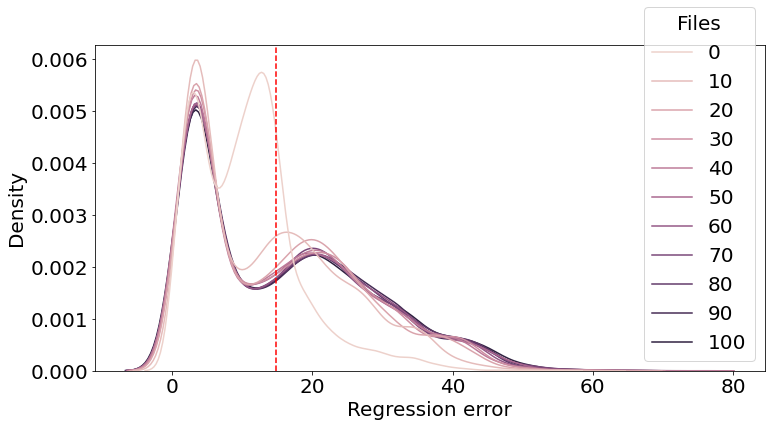

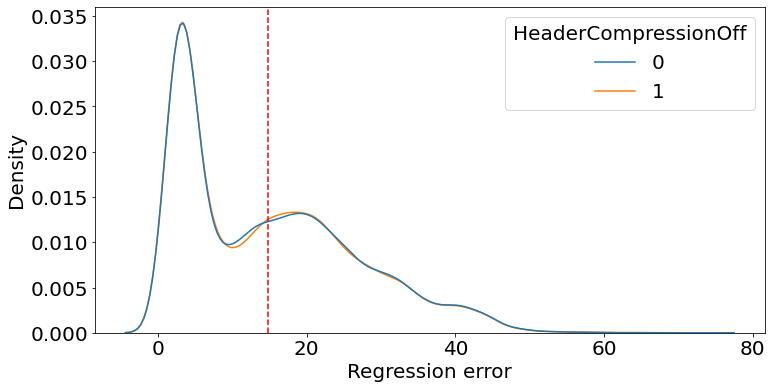

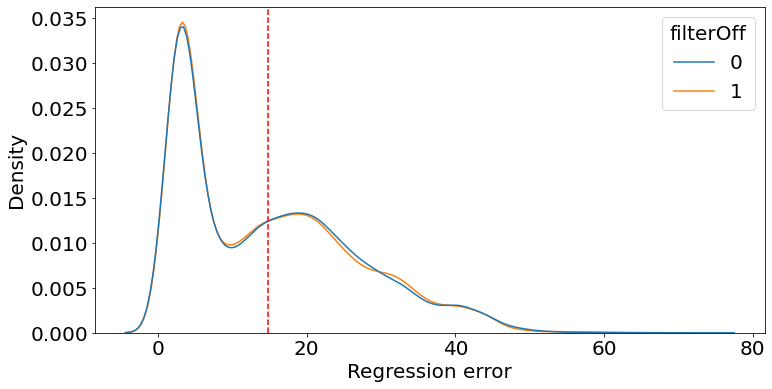

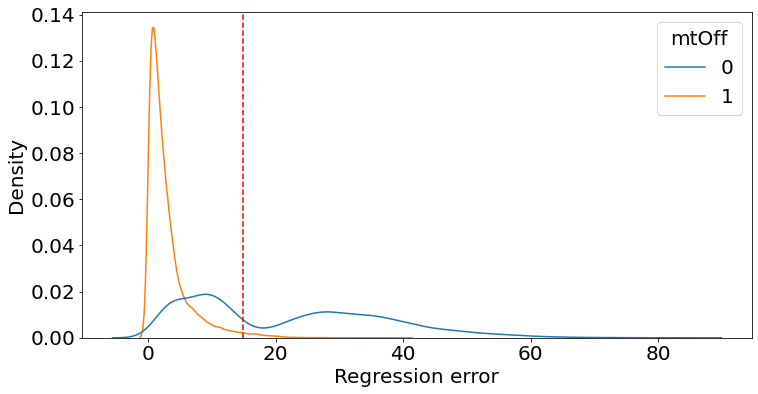

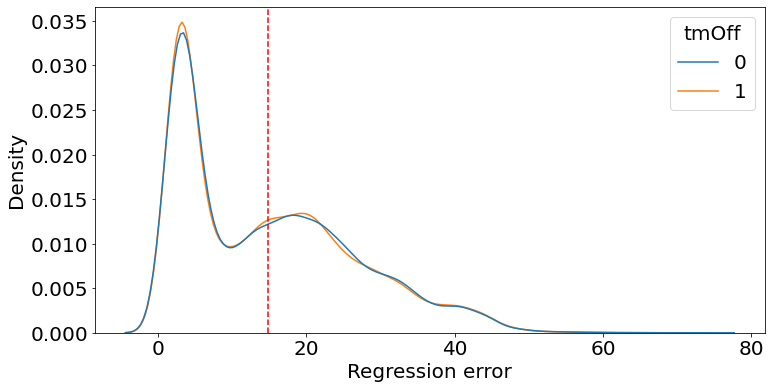

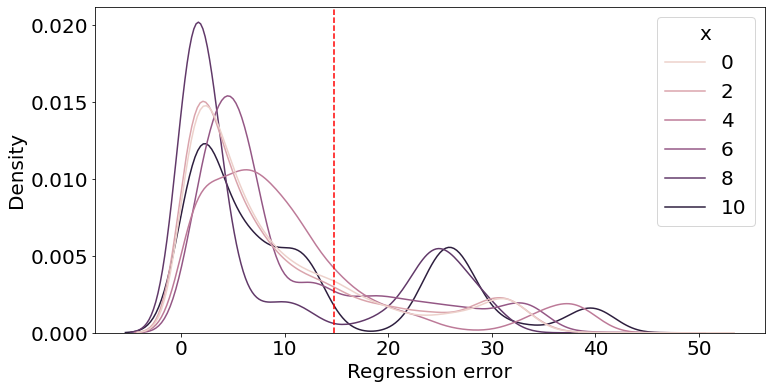

Apache


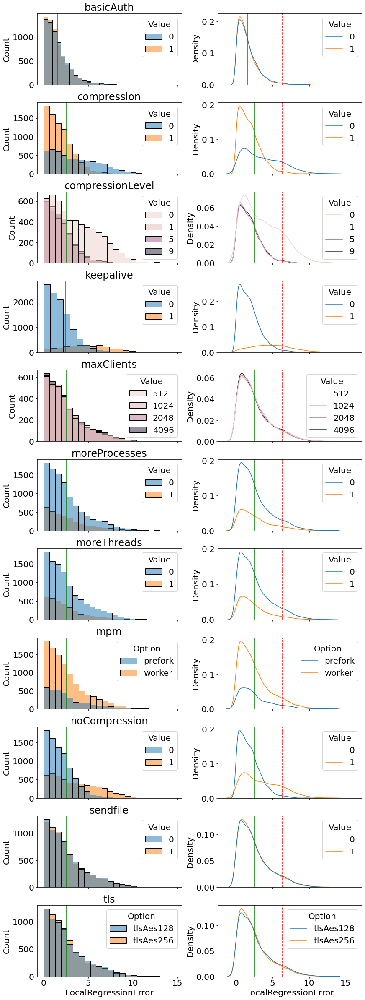

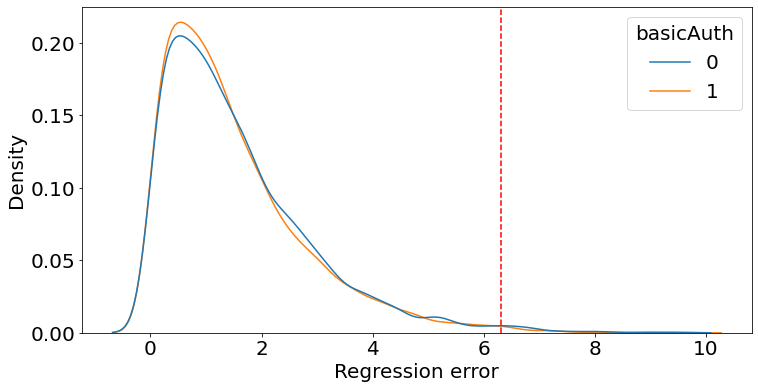

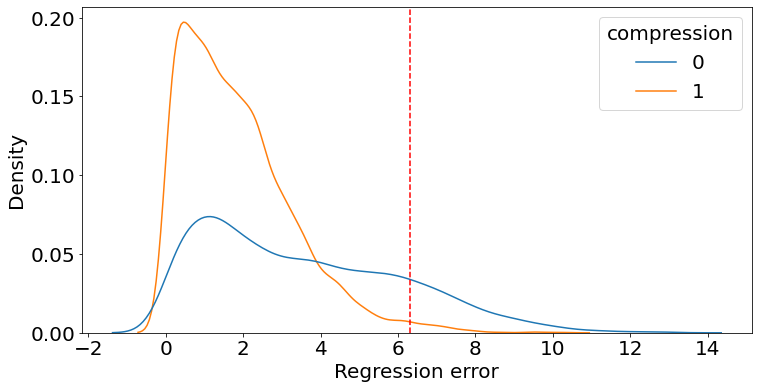

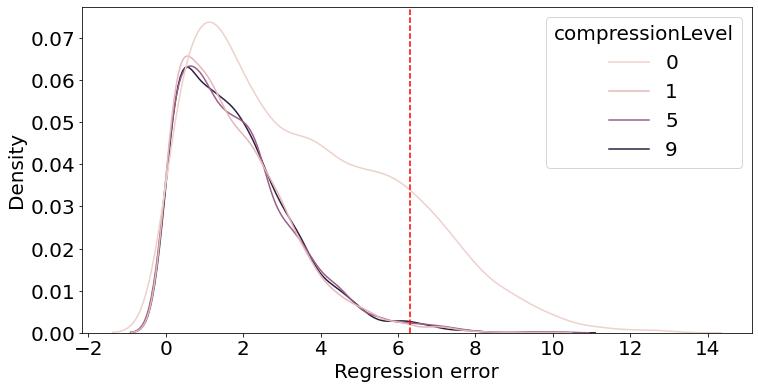

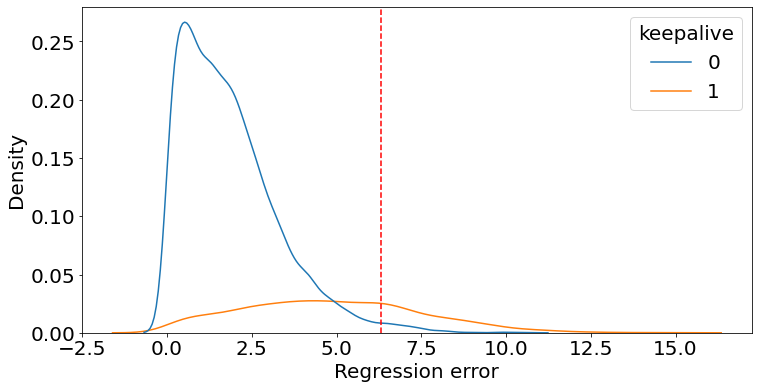

...

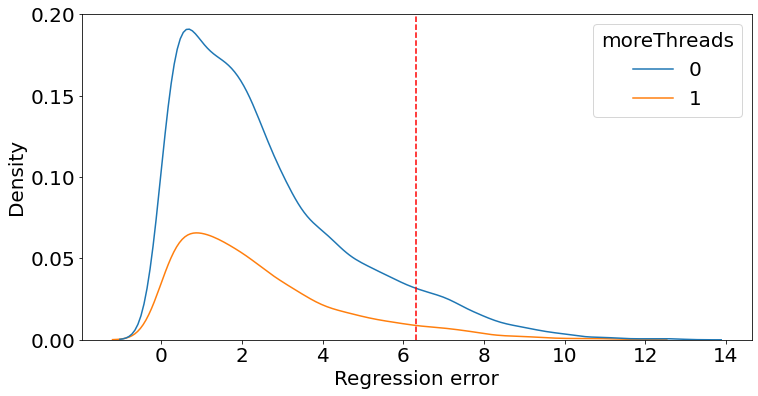

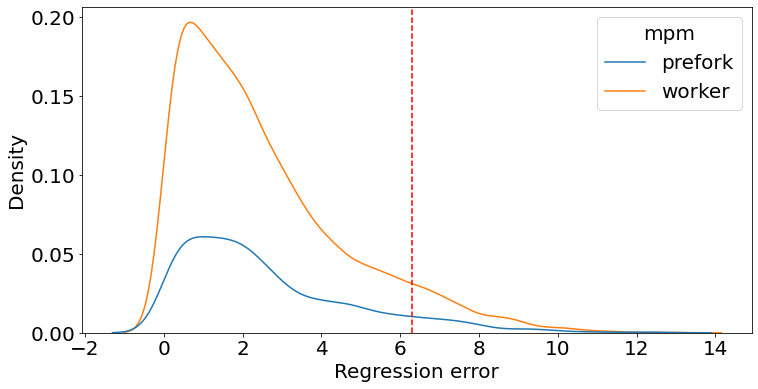

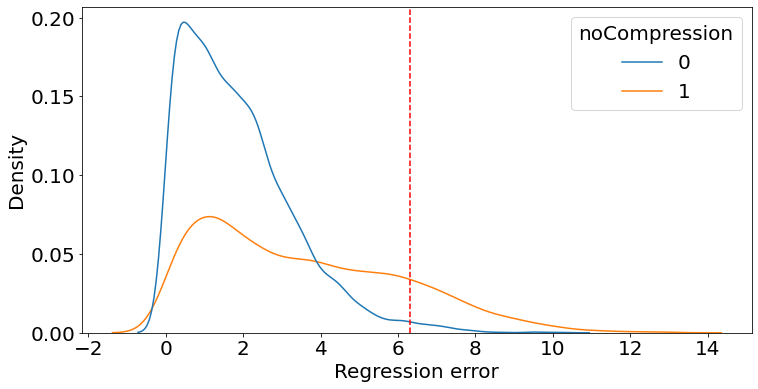

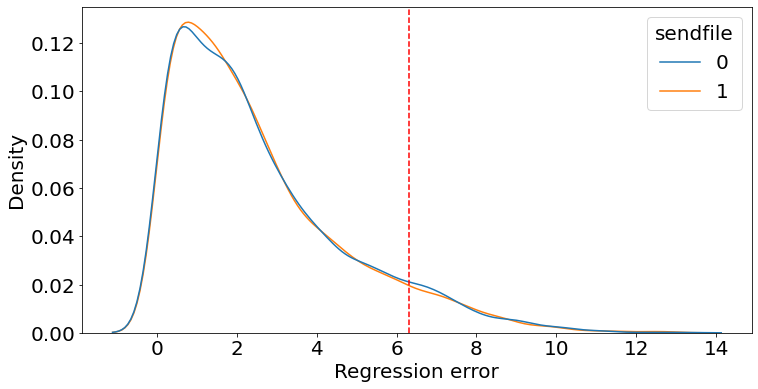

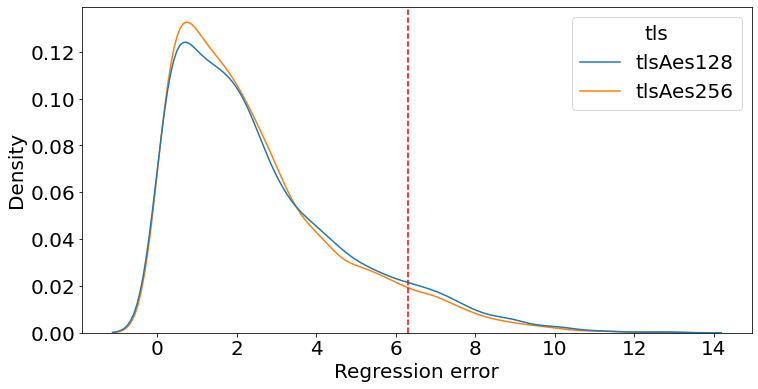

HSQLDB


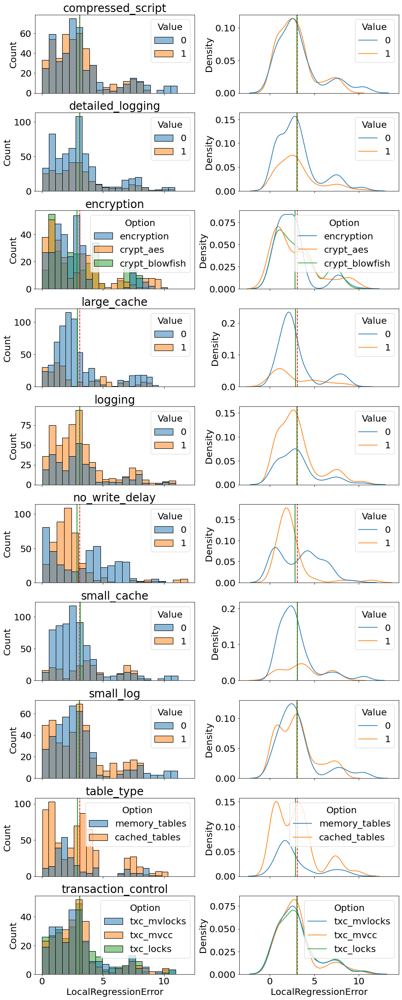

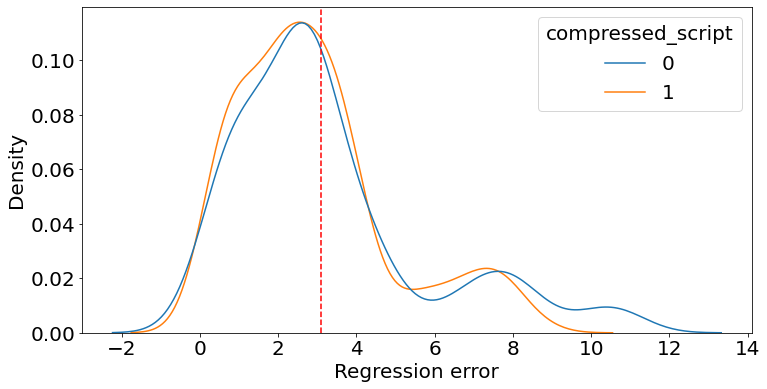

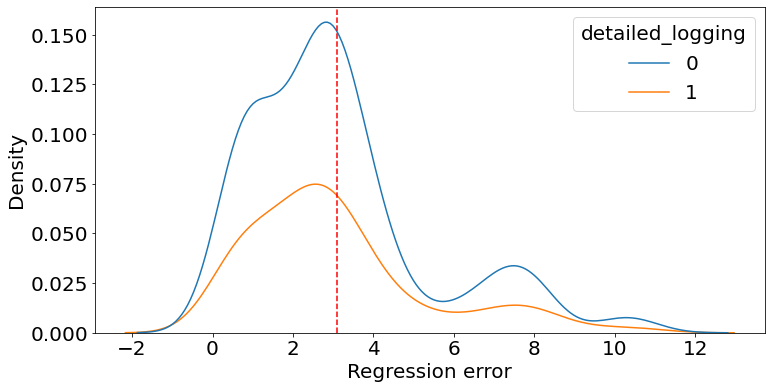

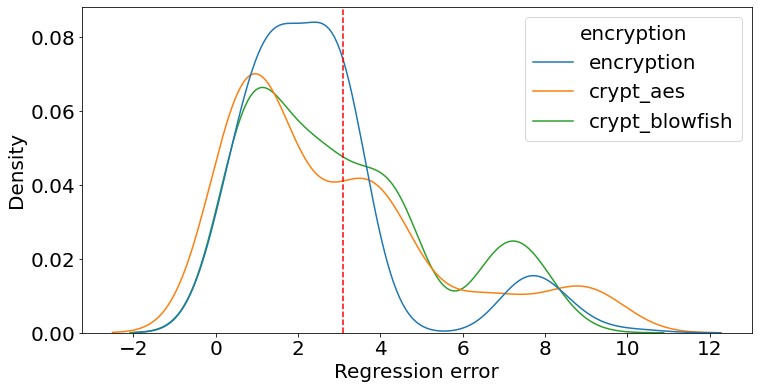

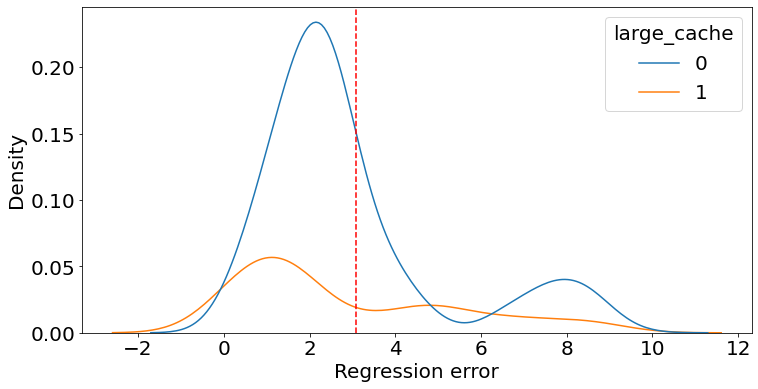

...

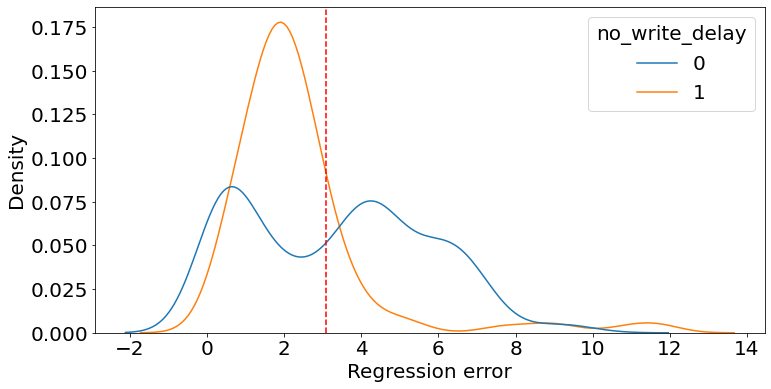

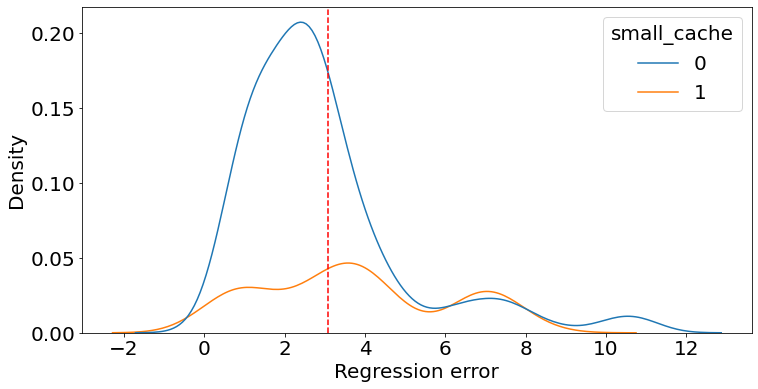

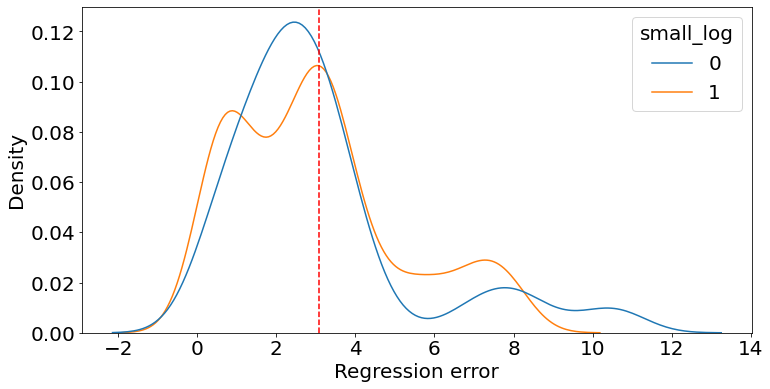

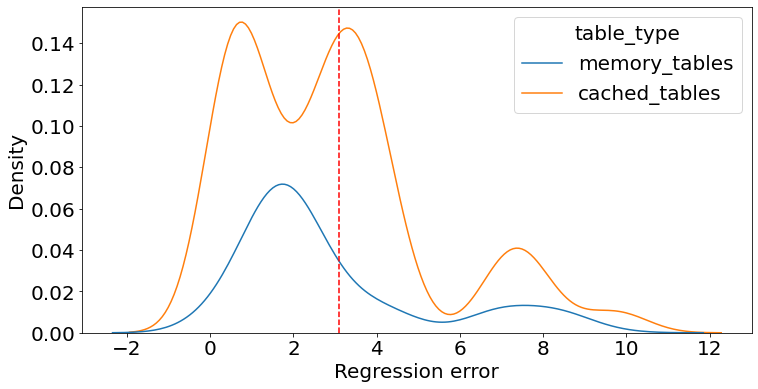

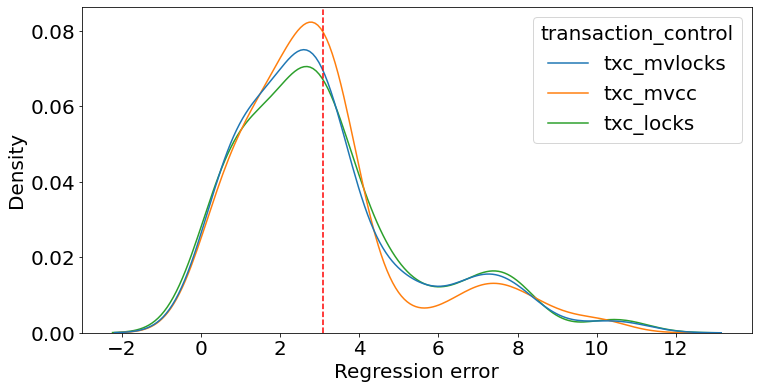

LLVM


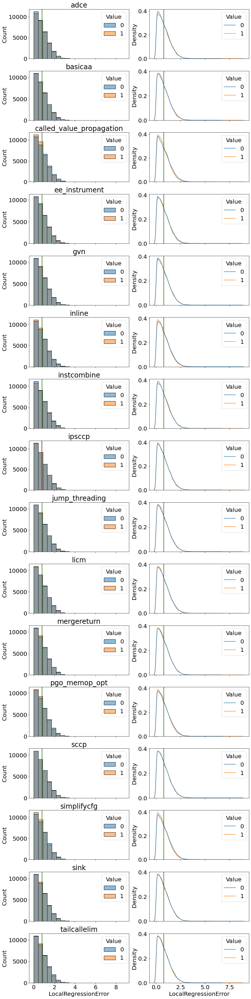

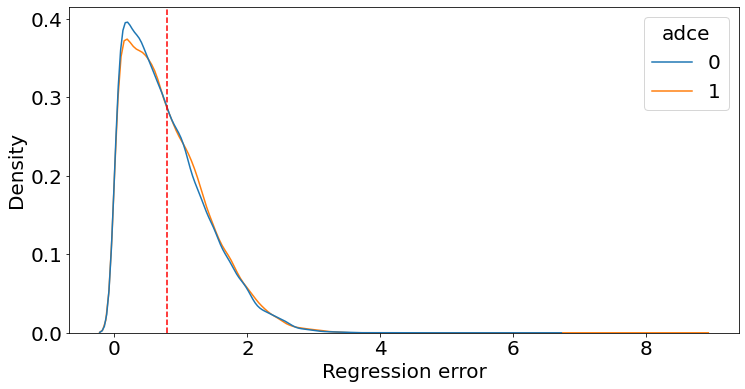

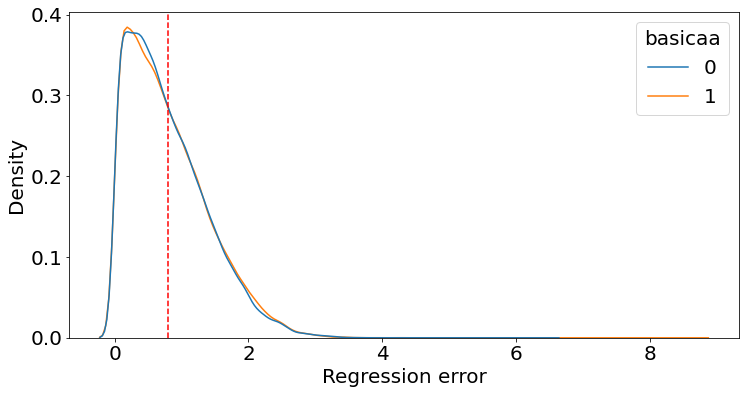

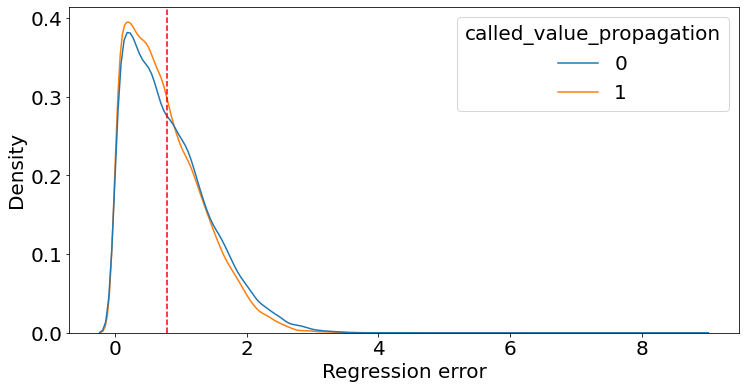

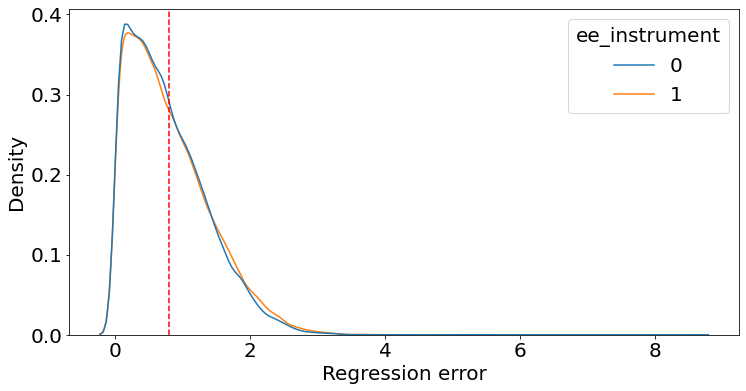

...

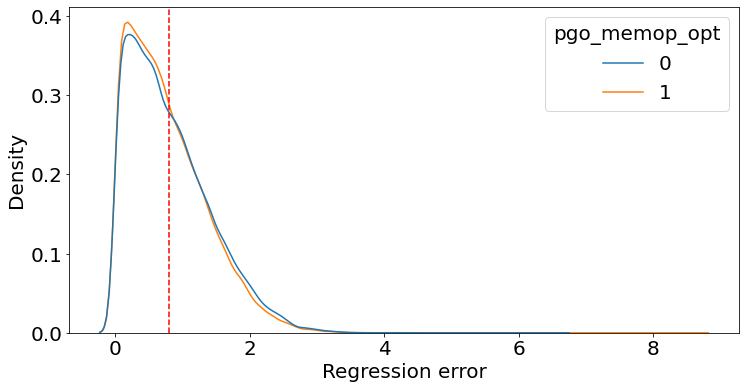

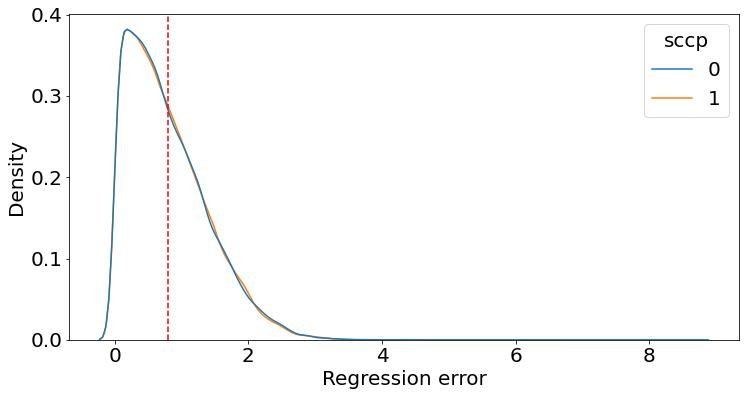

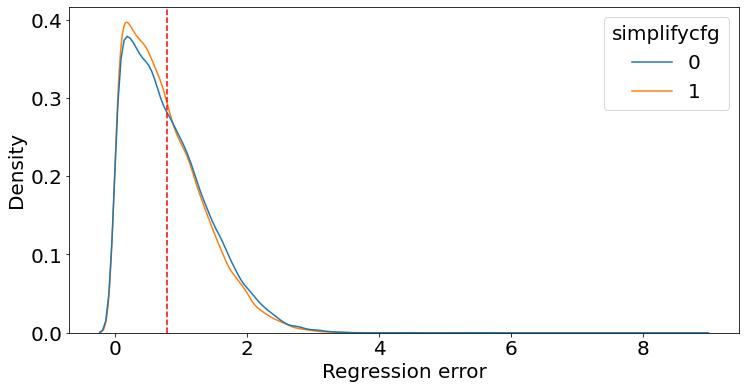

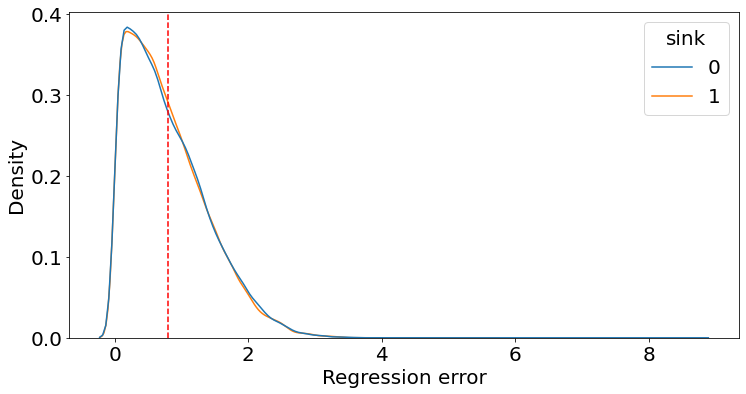

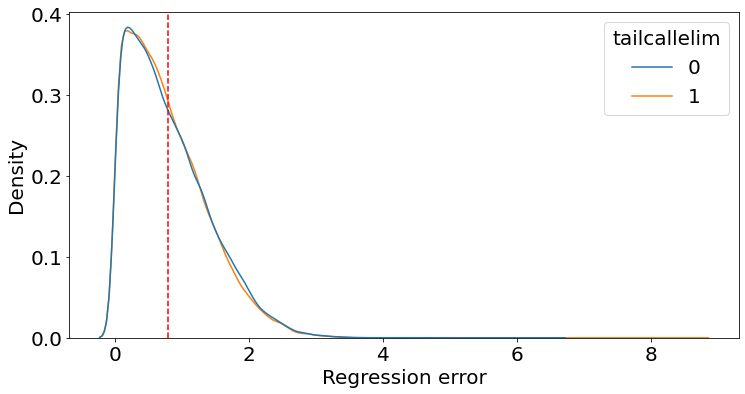

MongoDB


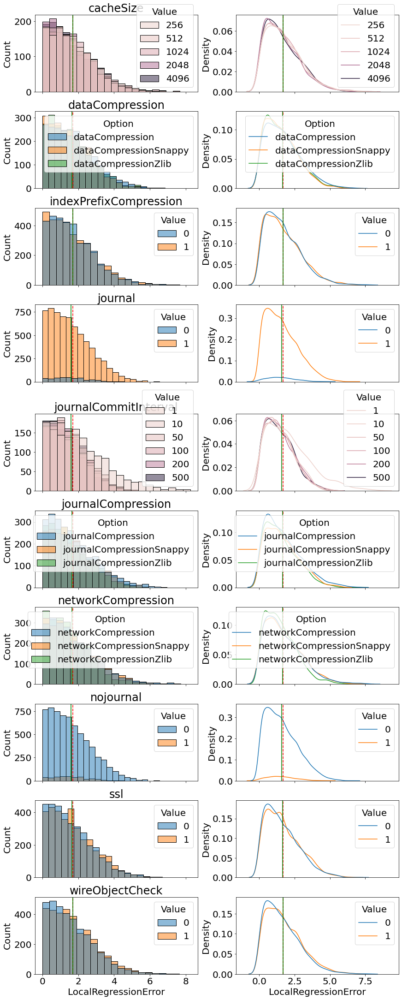

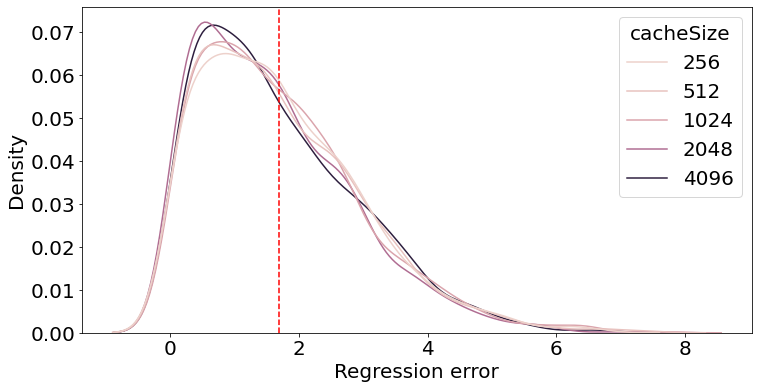

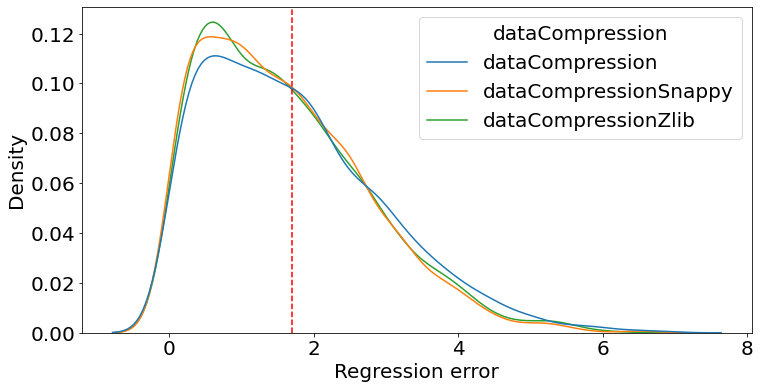

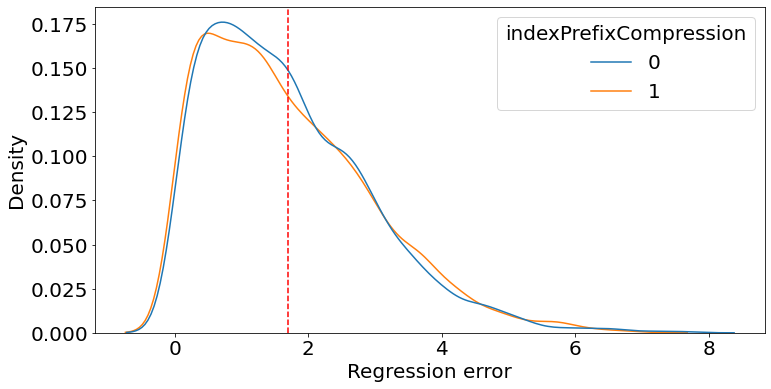

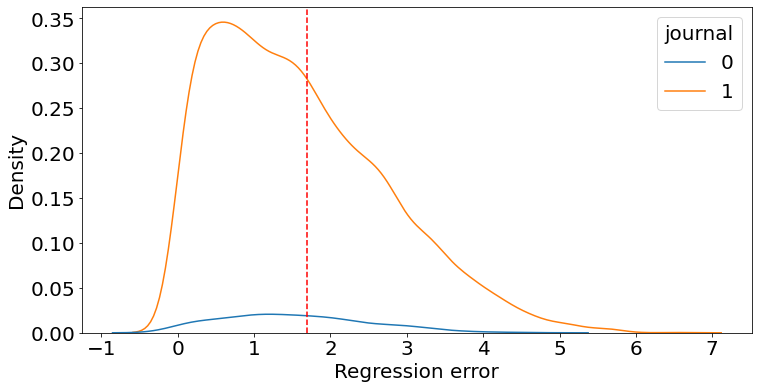

...

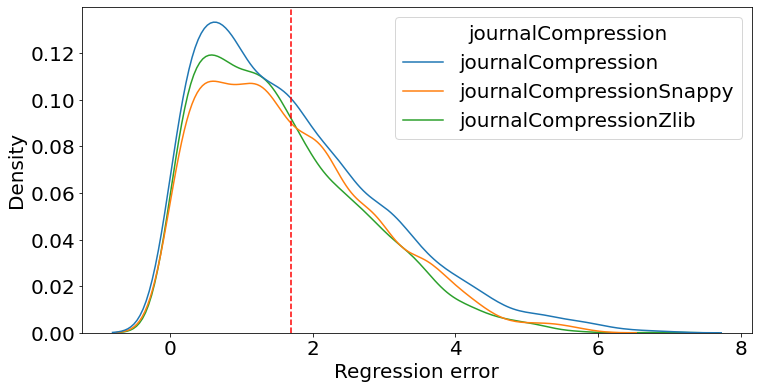

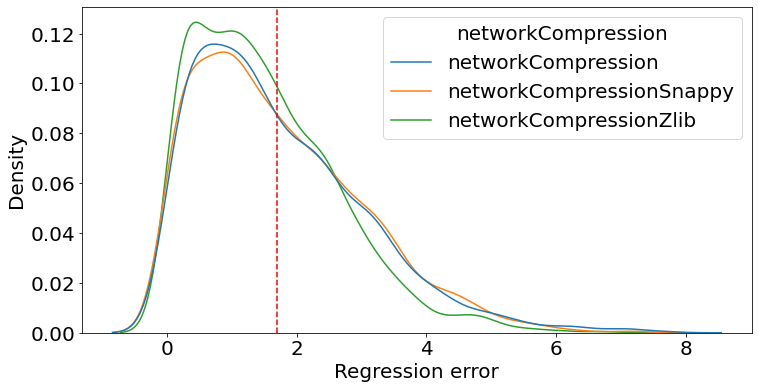

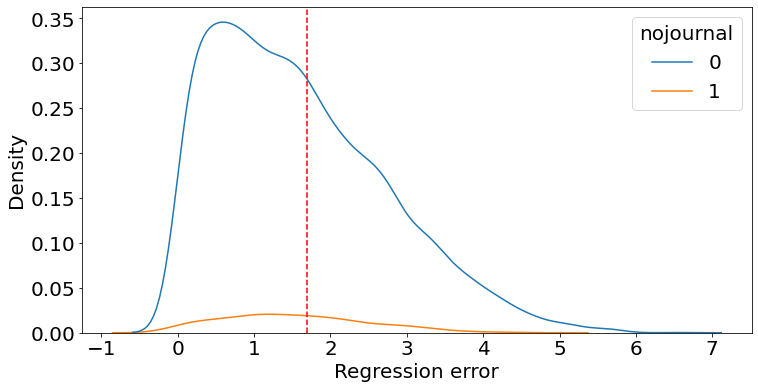

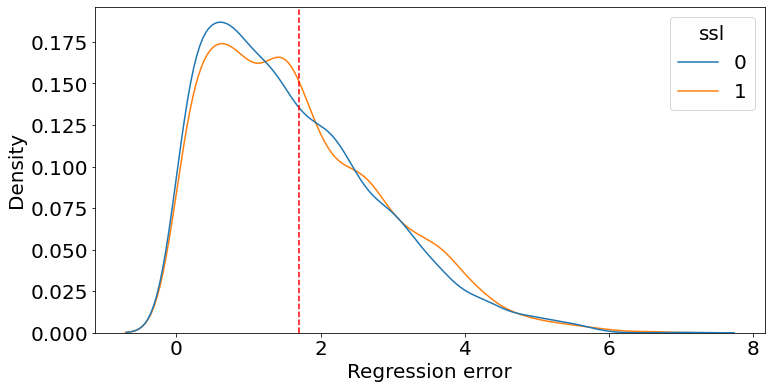

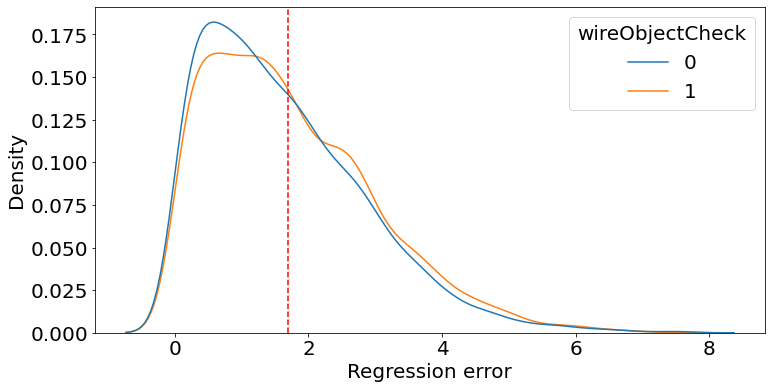

PostgreSQL


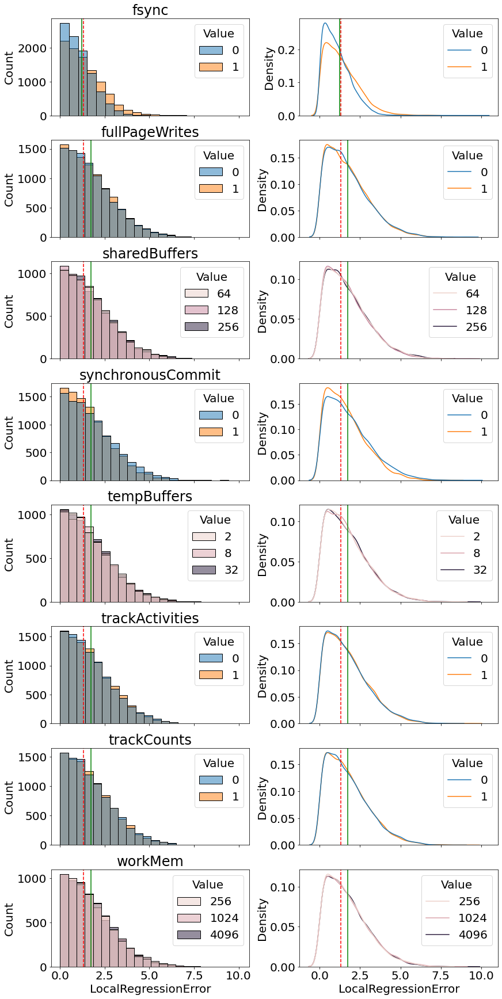

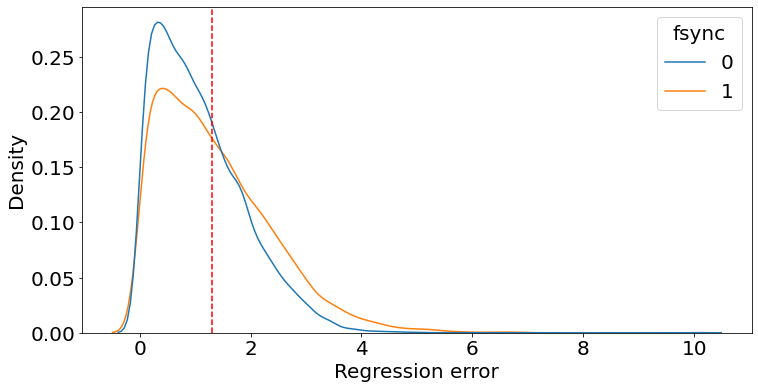

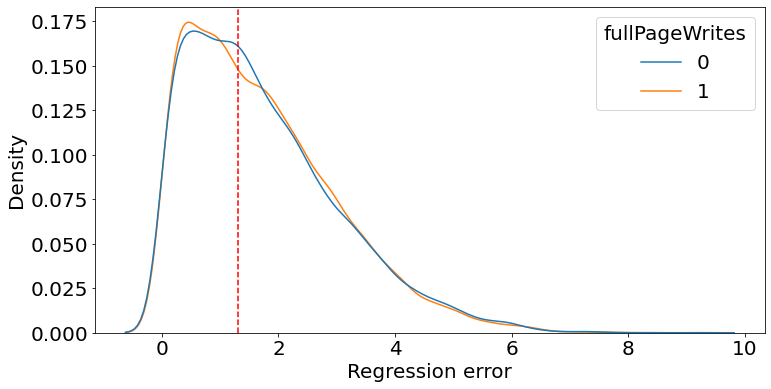

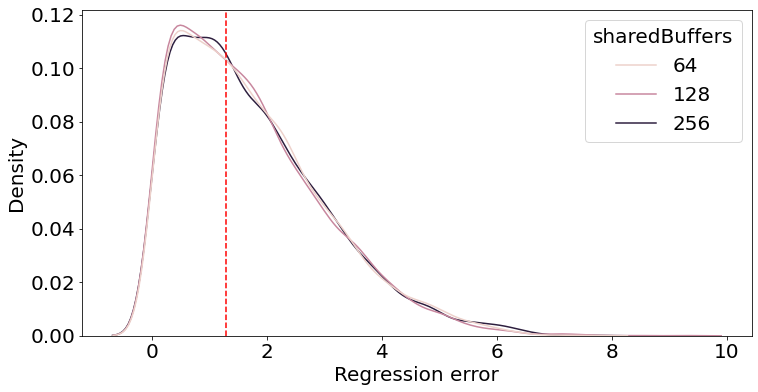

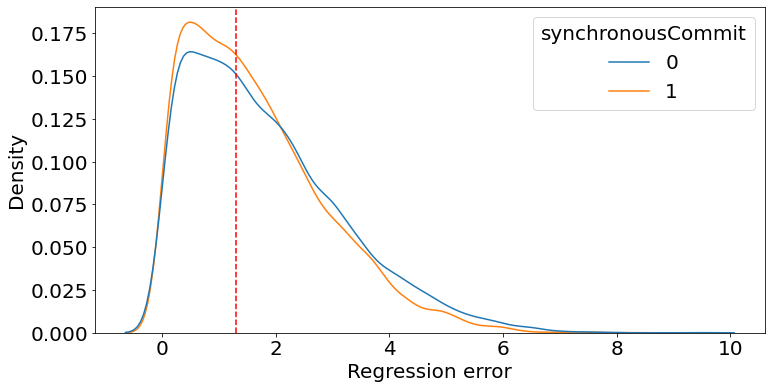

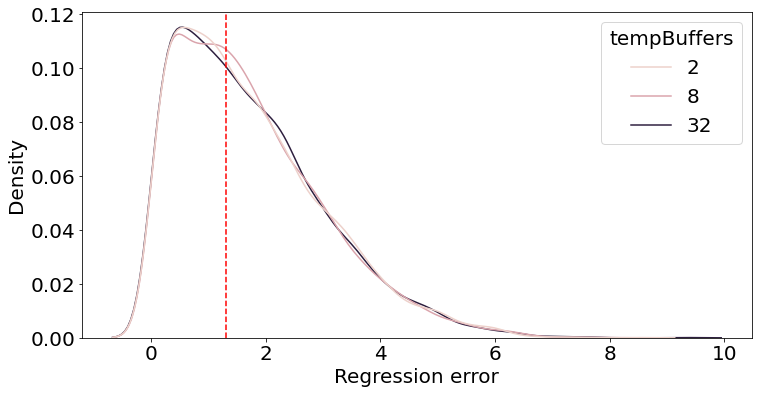

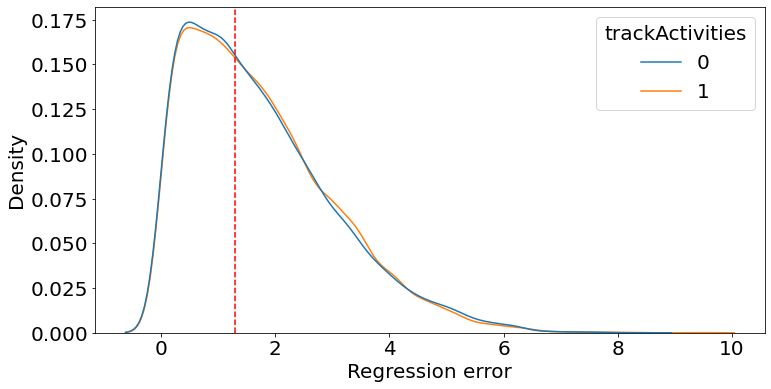

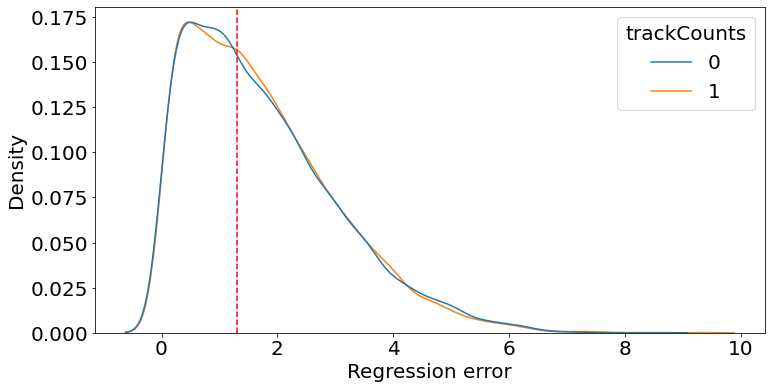

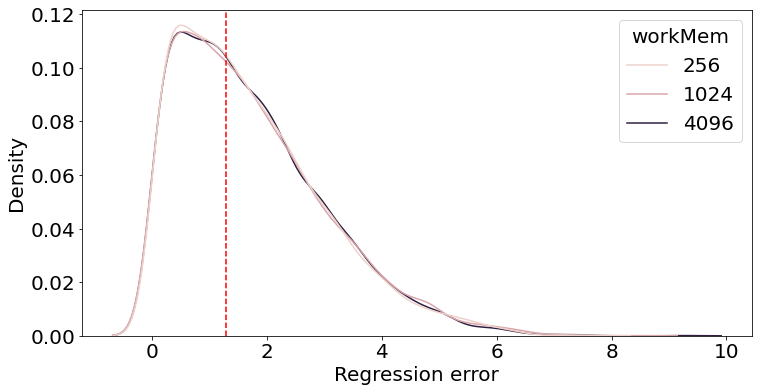

VP8


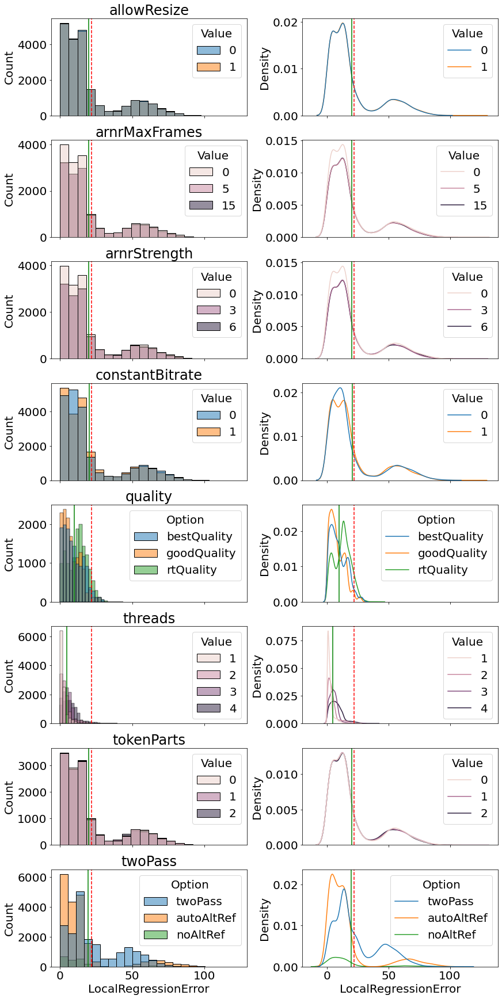

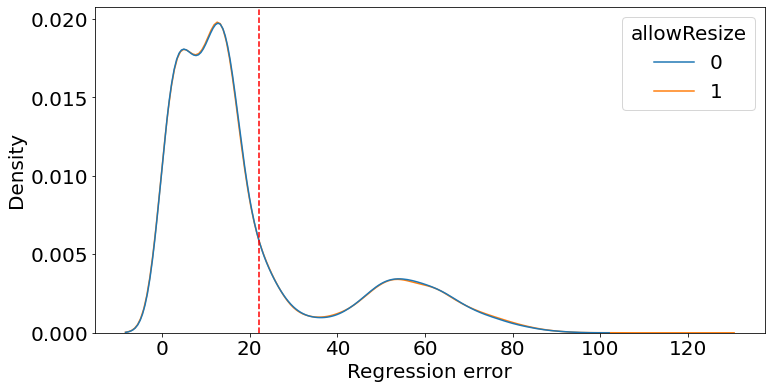

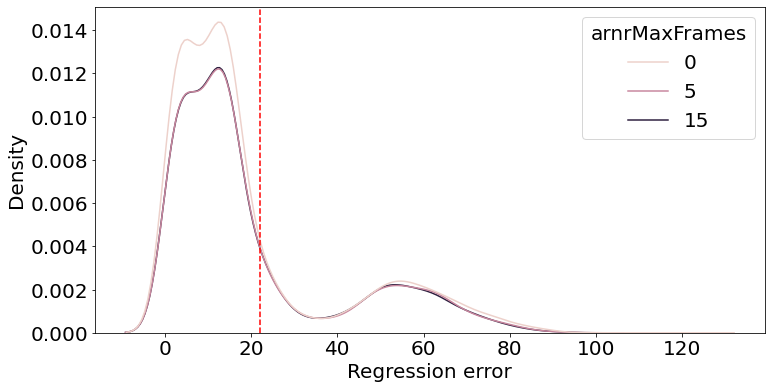

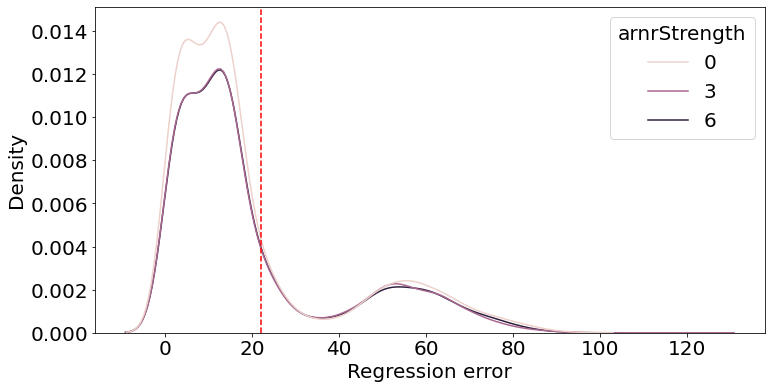

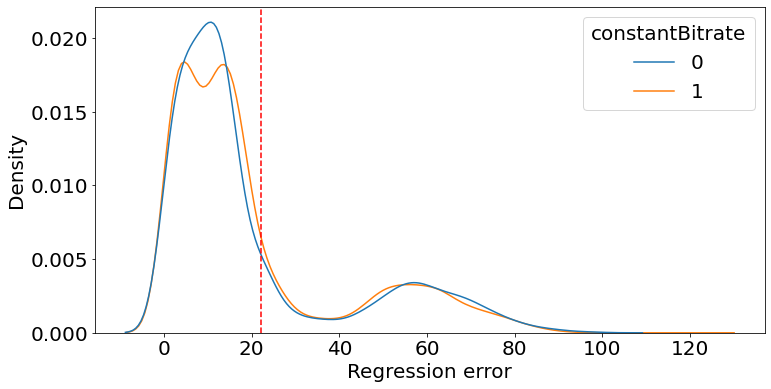

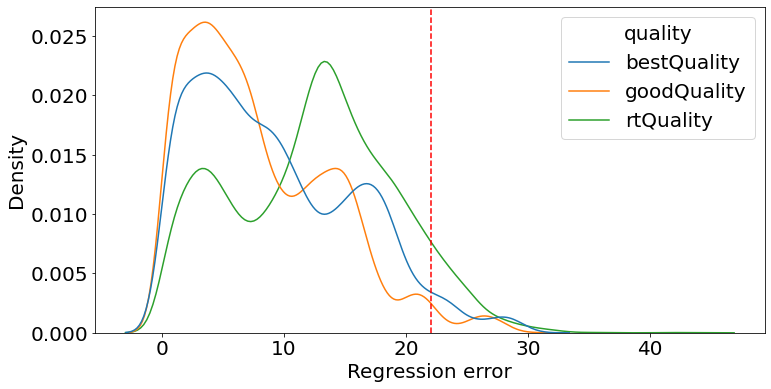

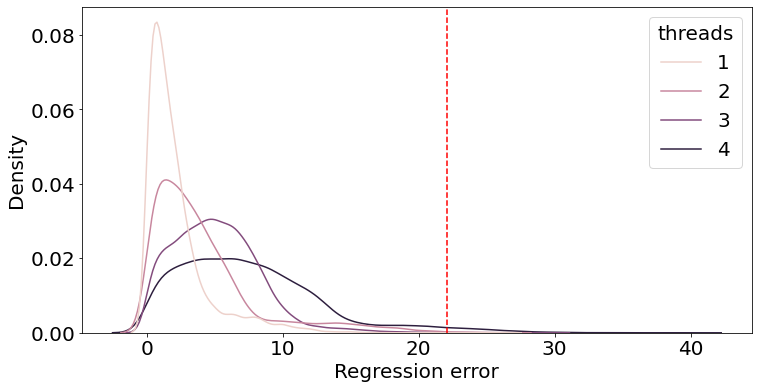

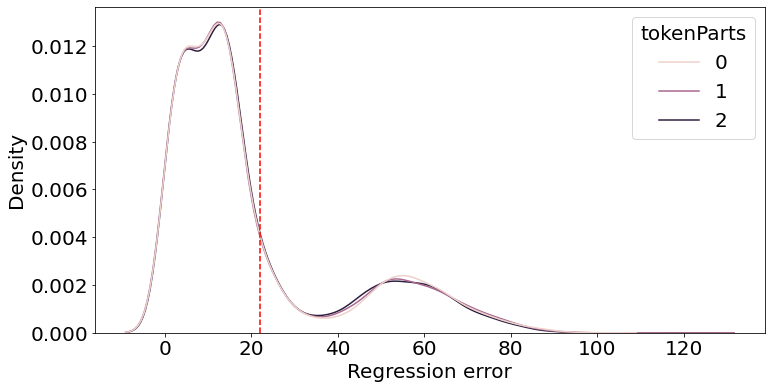

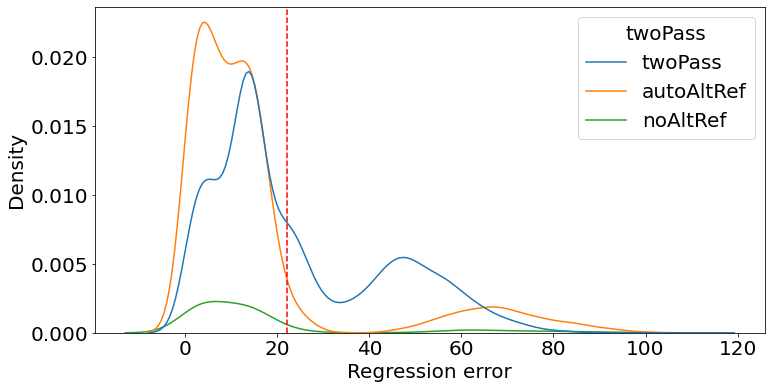

brotli


/tmp/ipykernel_16309/3785231087.py:74: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  plt.savefig('/home/mweber/git/performance-energy-correlation-code/out/RQ2/' + study +
/tmp/ipykernel_16309/3785231087.py:74: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  plt.savefig('/home/mweber/git/performance-energy-correlation-code/out/RQ2/' + study +
/tmp/ipykernel_16309/3785231087.py:76: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or axes decorations smaller.
  plt.savefig('/home/mweber/git/performance-energy-correlation-code/out/RQ2/' + study +
/home/mweber/projects/SWTP-21-22/swtp21-22/lib/python3.10/site-packages/IPython/core/pylabtools.py:151: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure lar

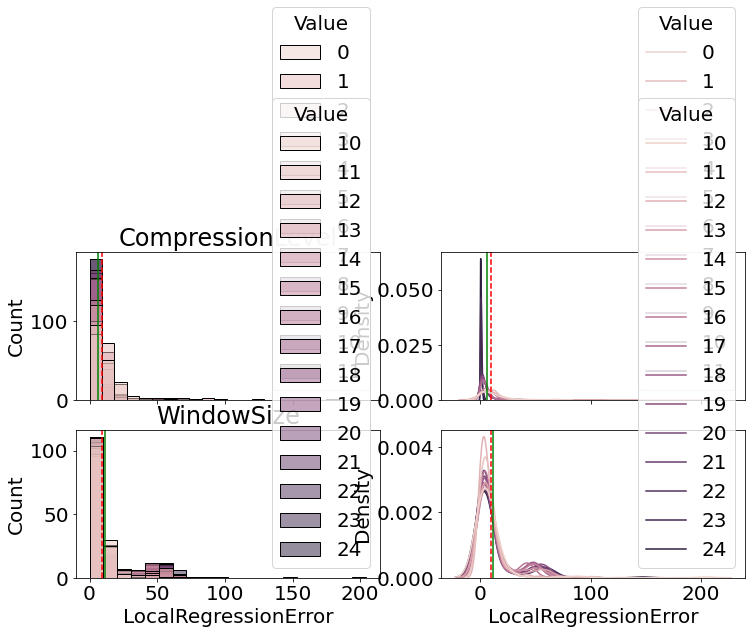

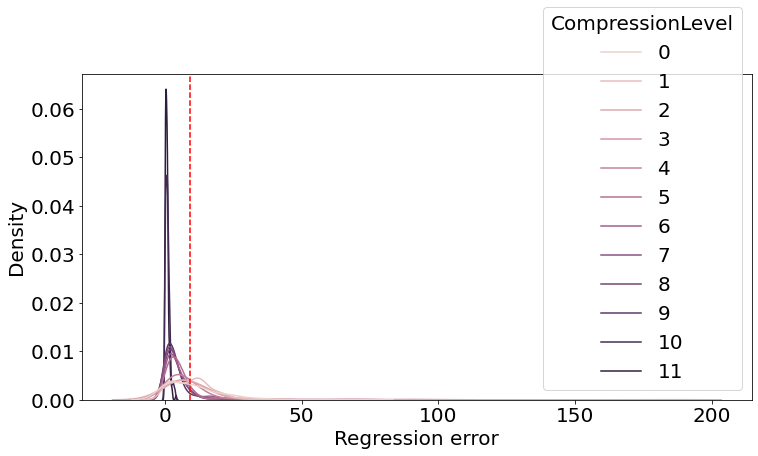

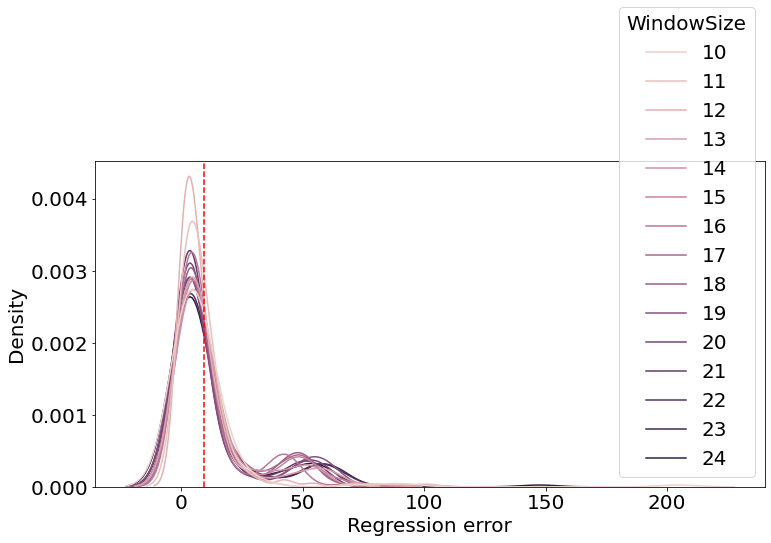

exastencils


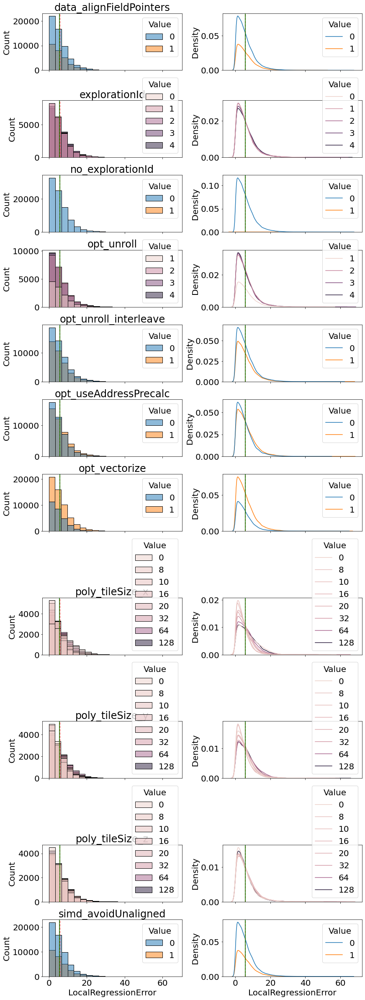

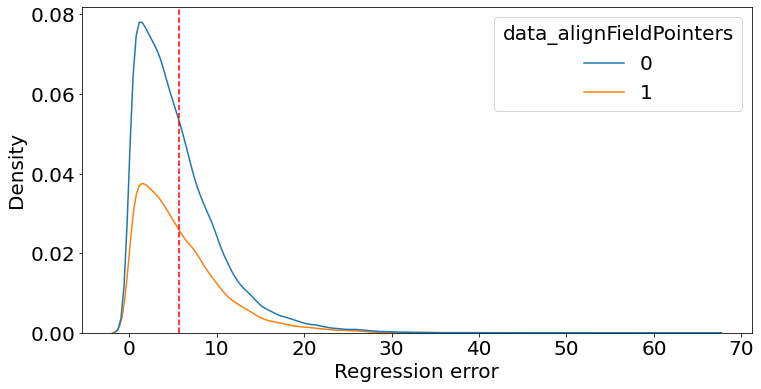

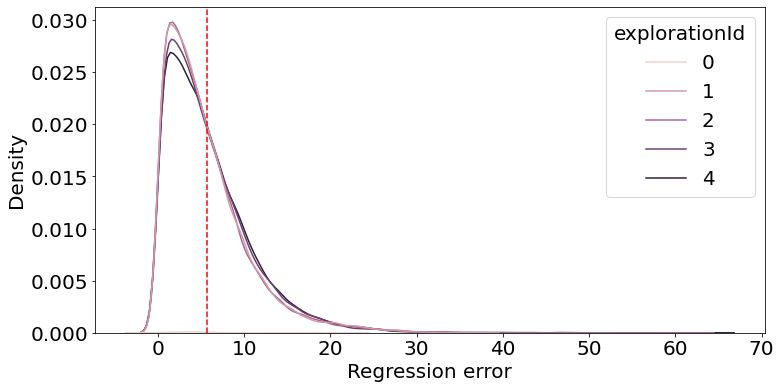

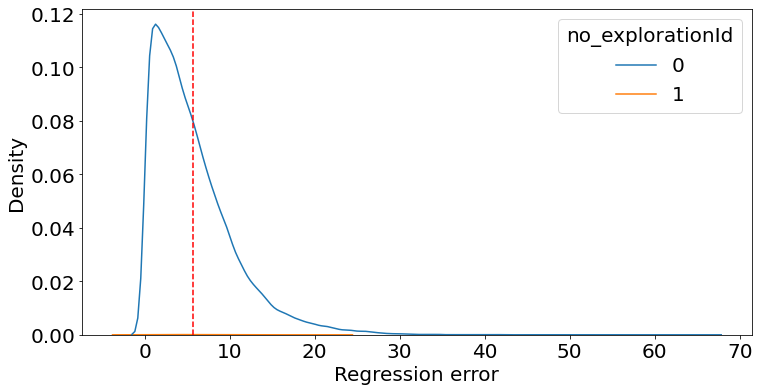

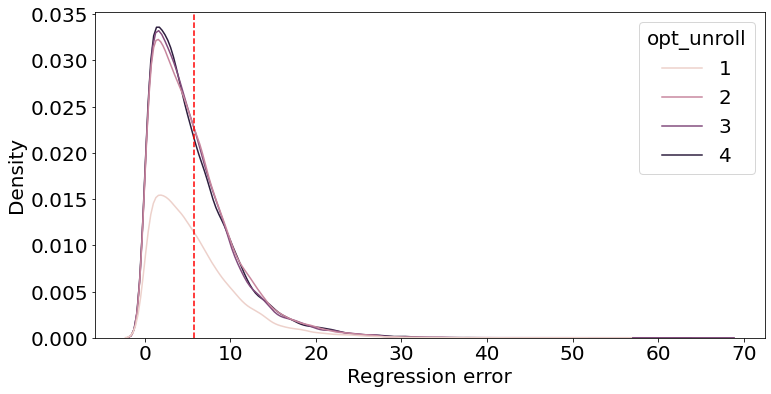

...

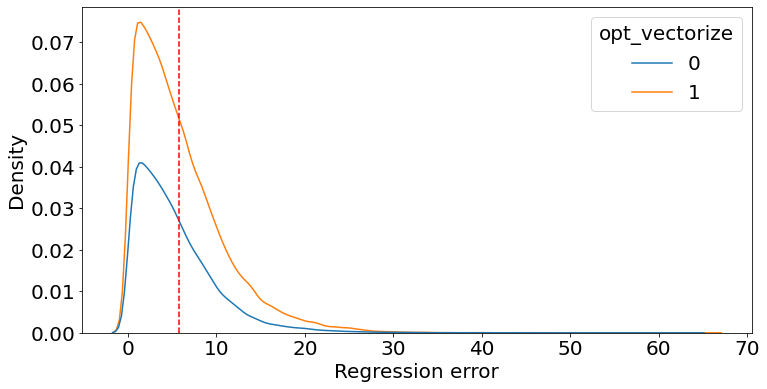

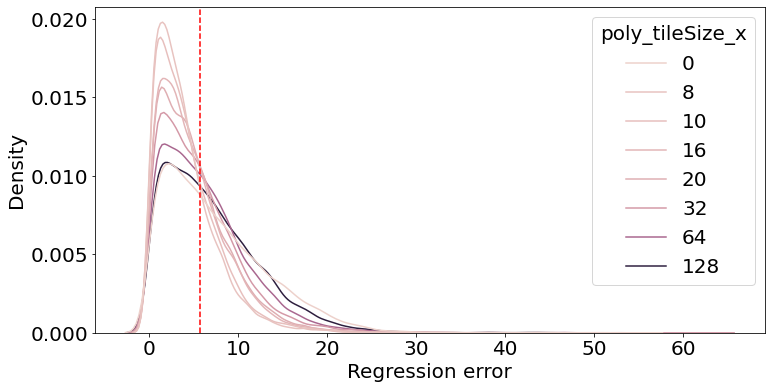

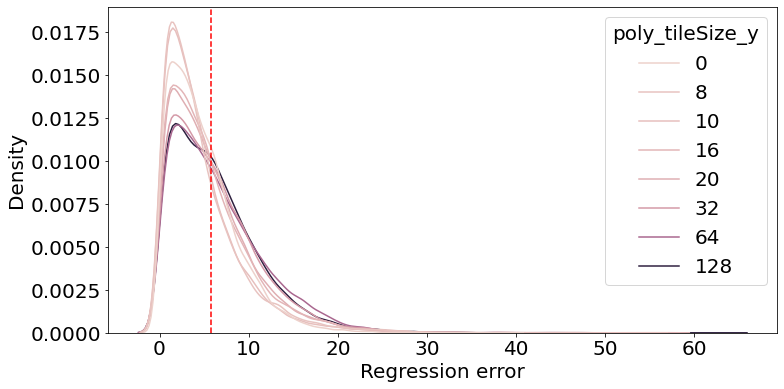

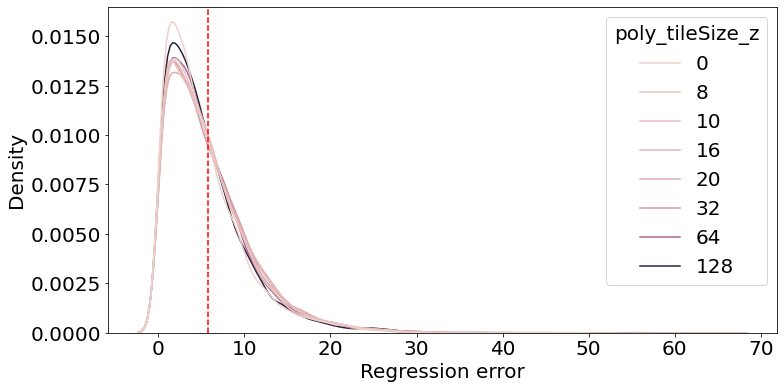

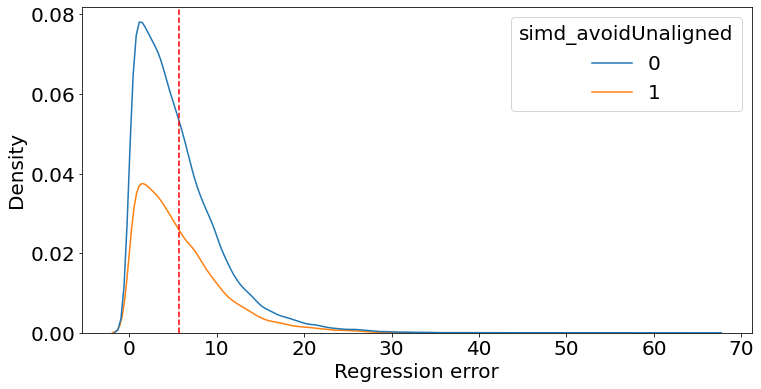

jump3r


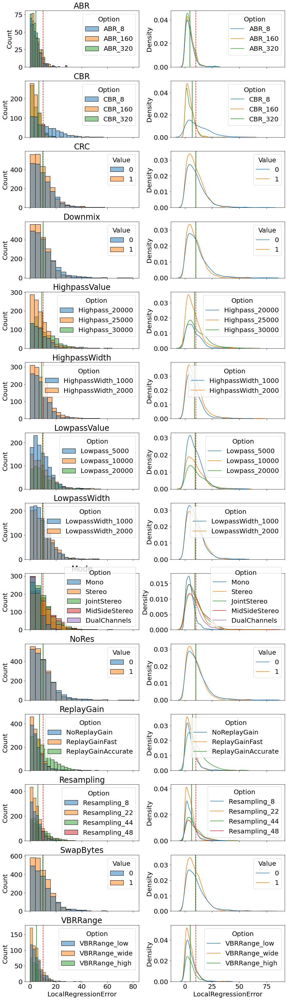

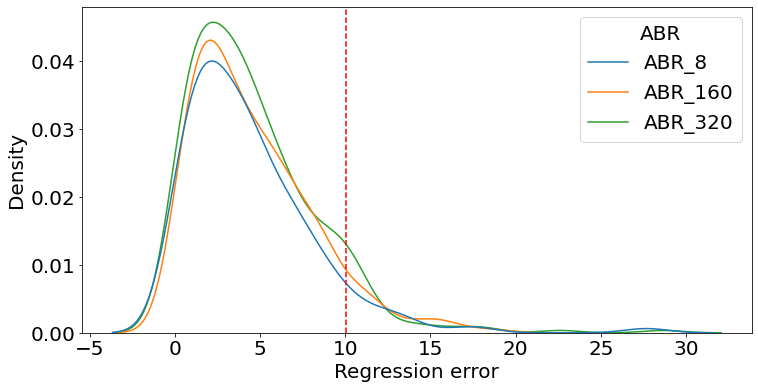

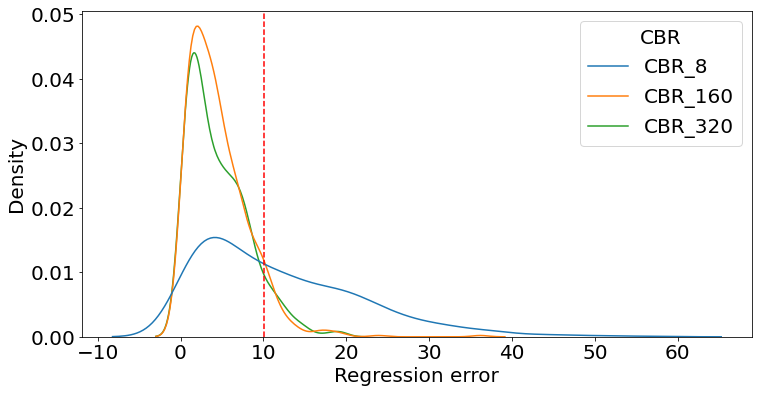

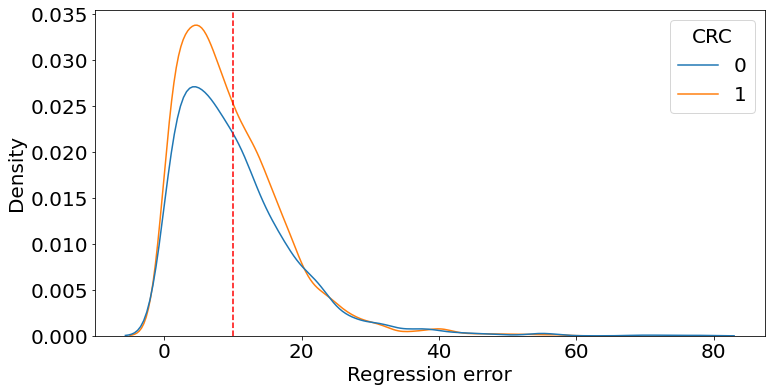

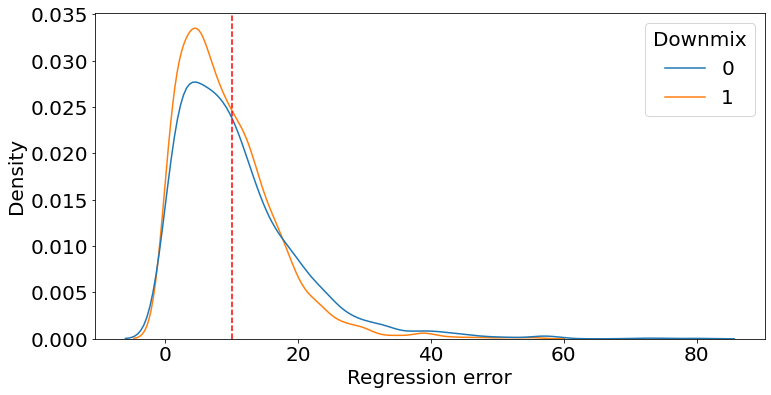

...

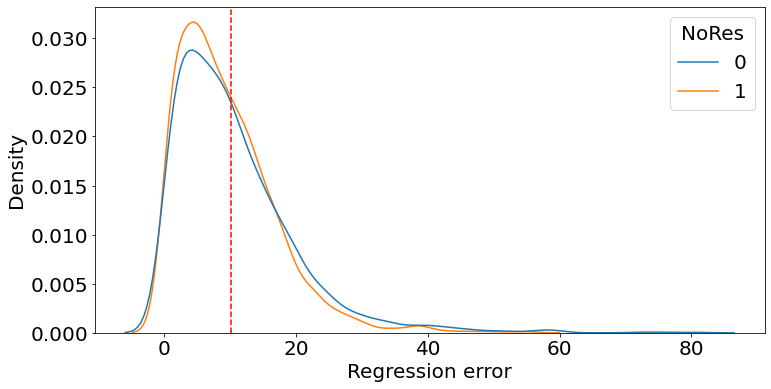

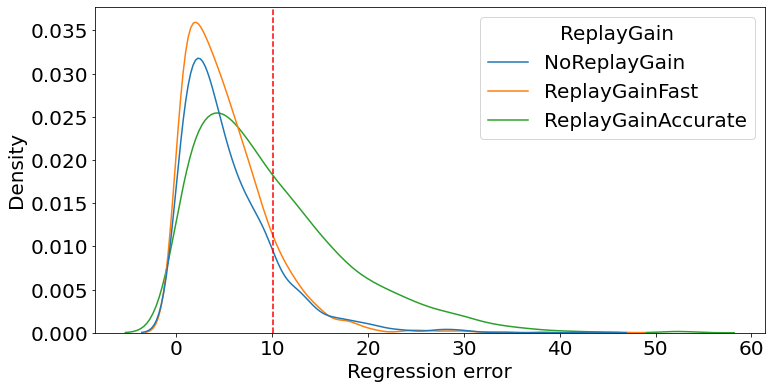

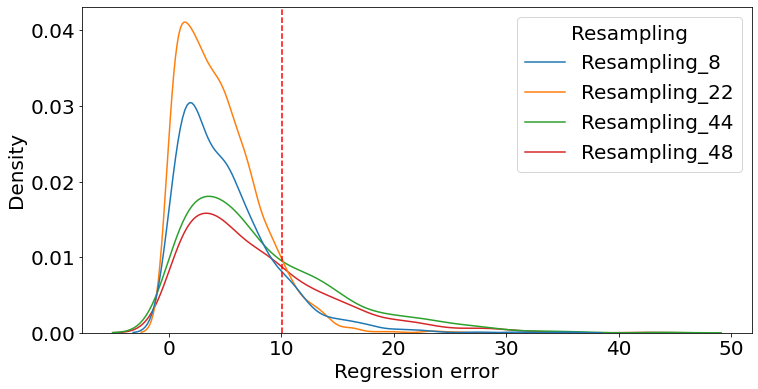

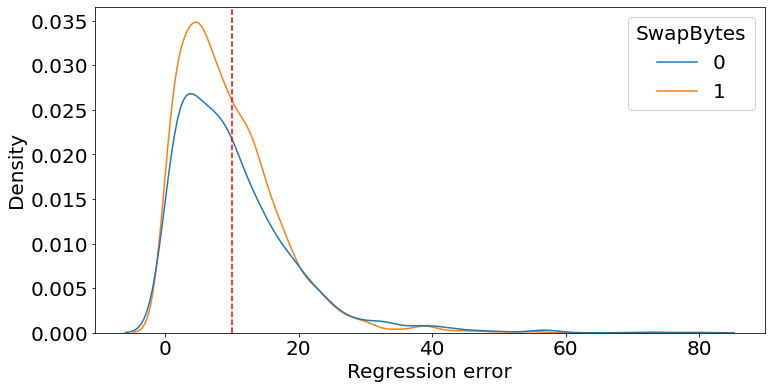

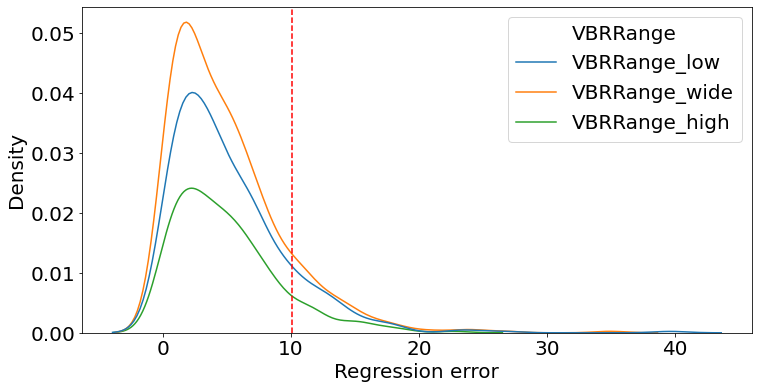

kanzi


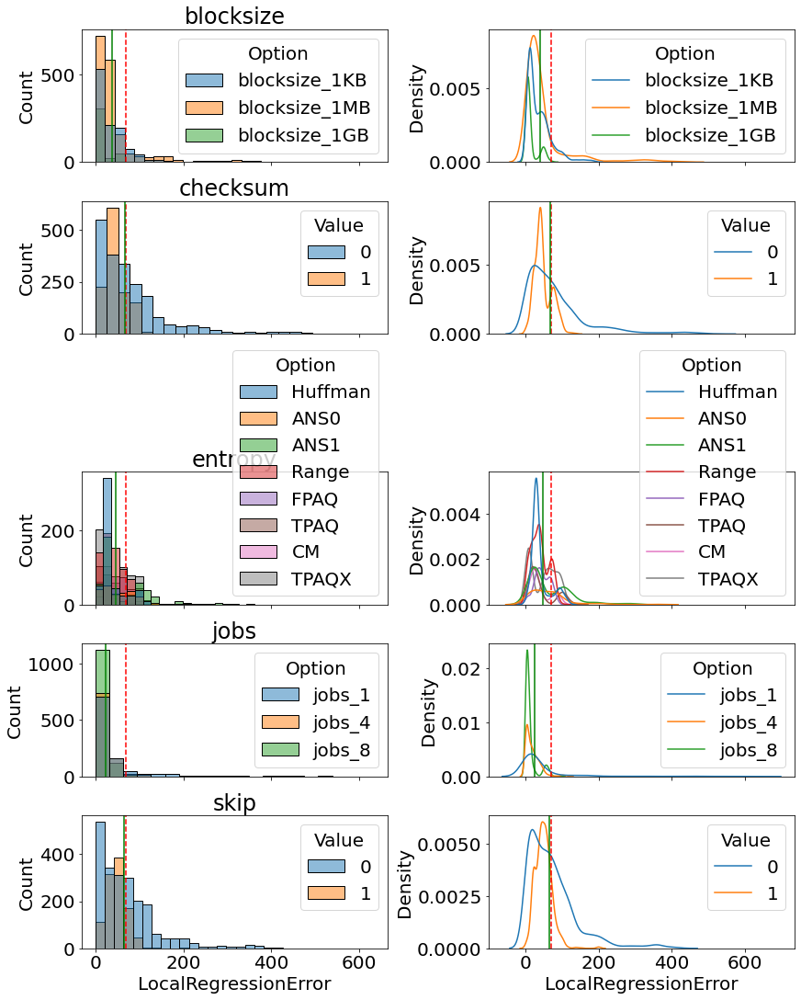

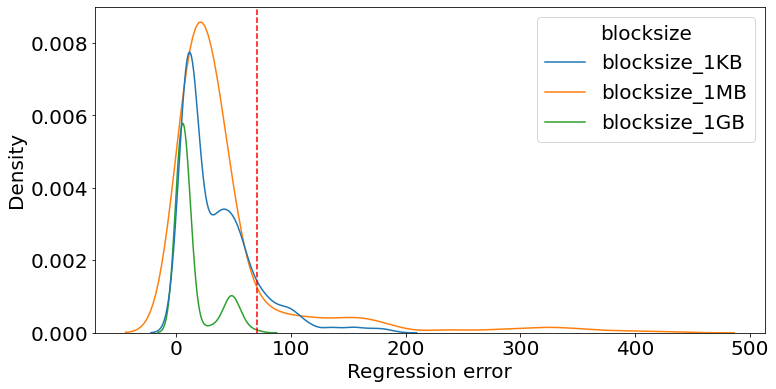

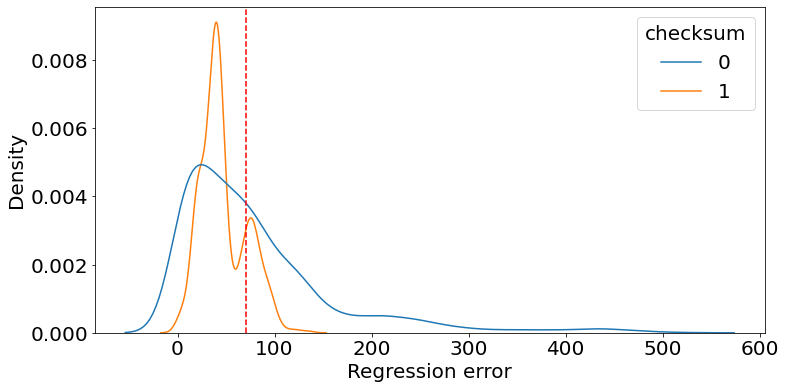

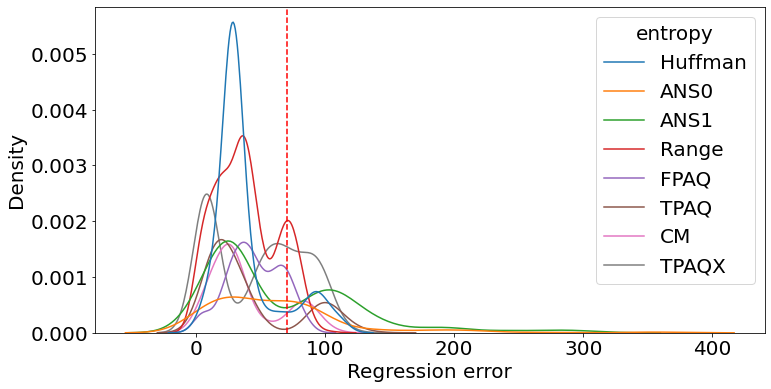

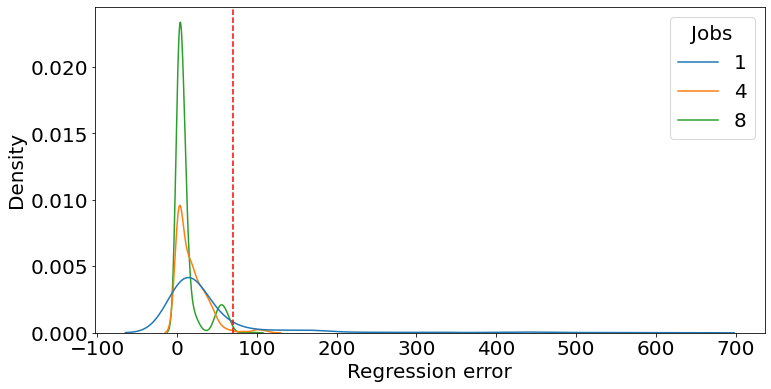

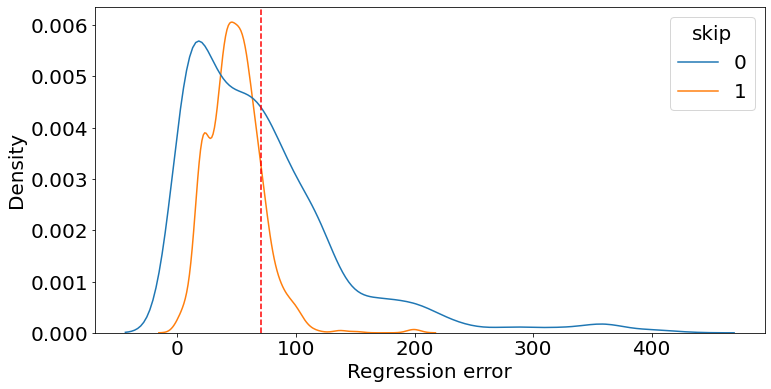

lrzip


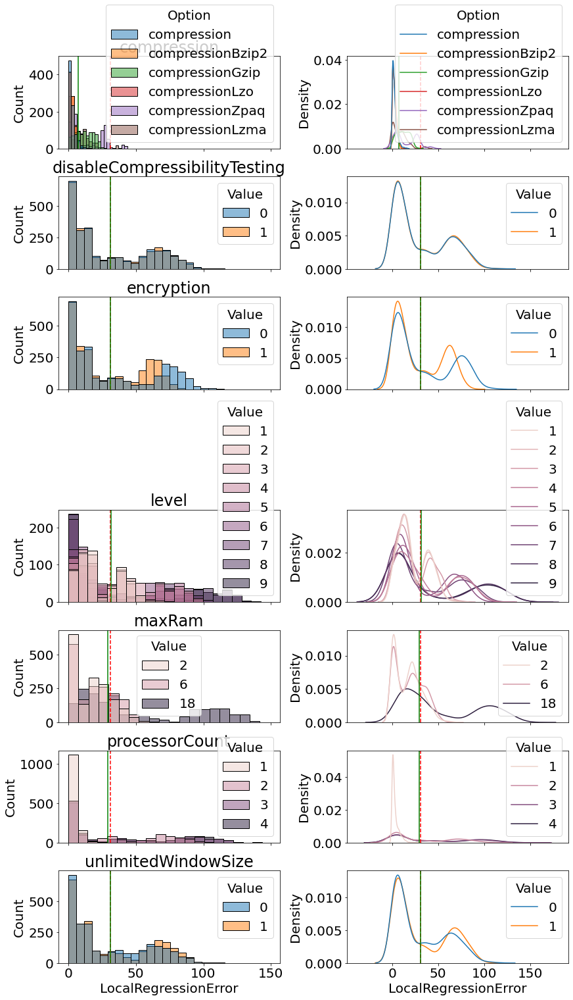

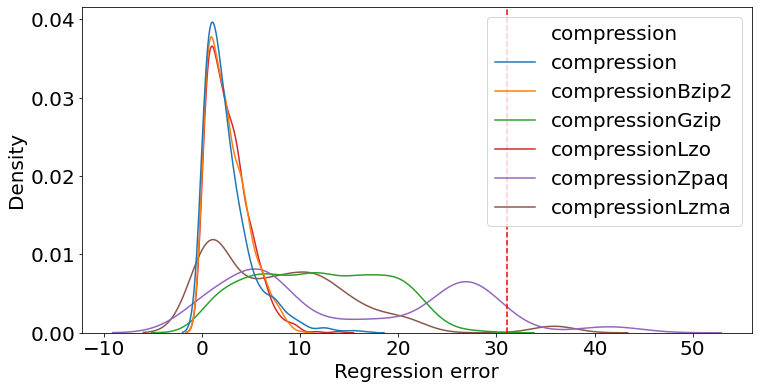

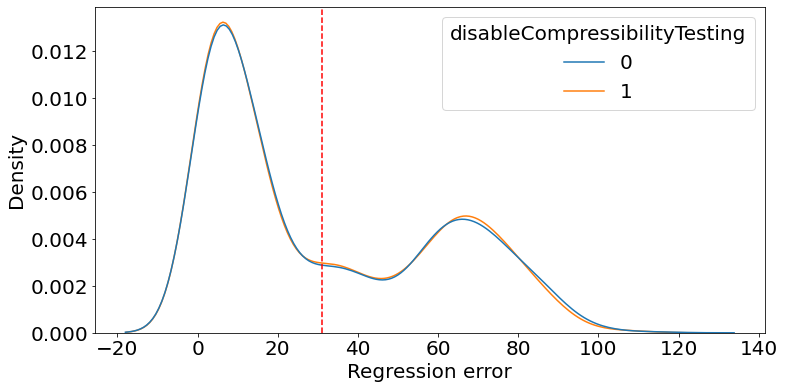

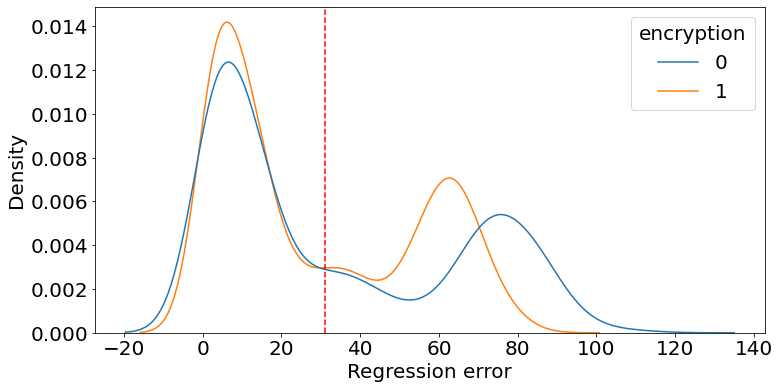

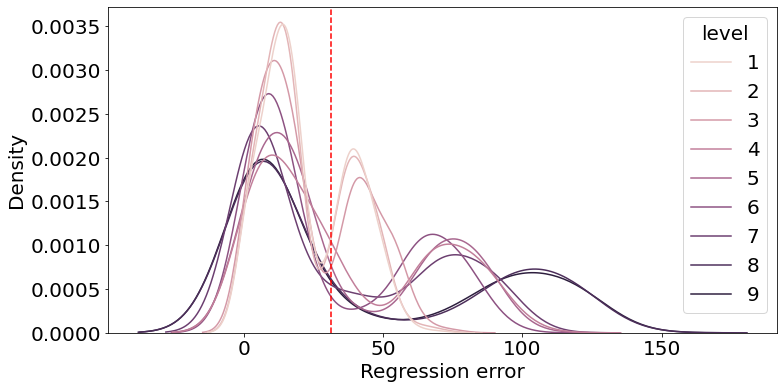

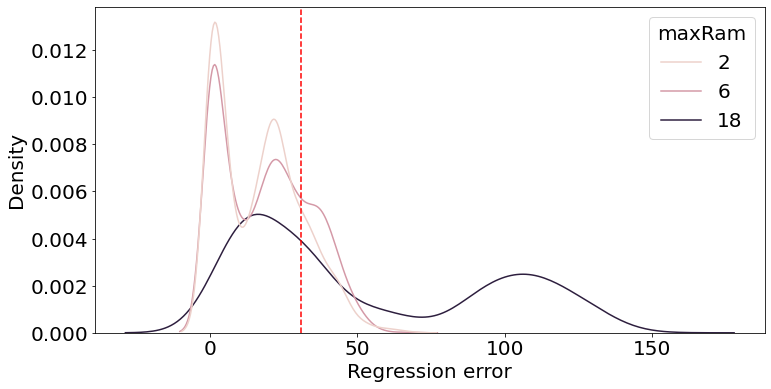

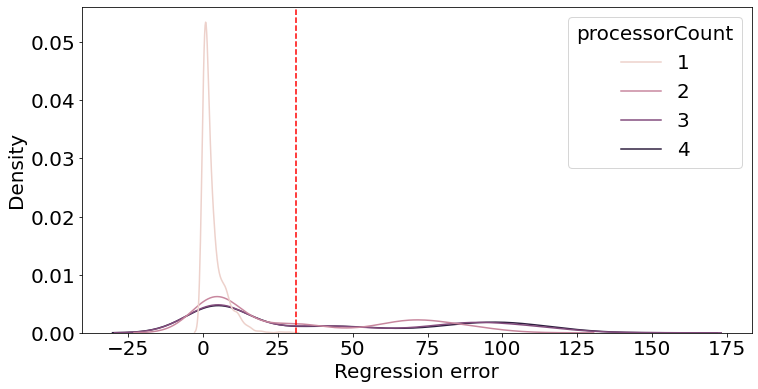

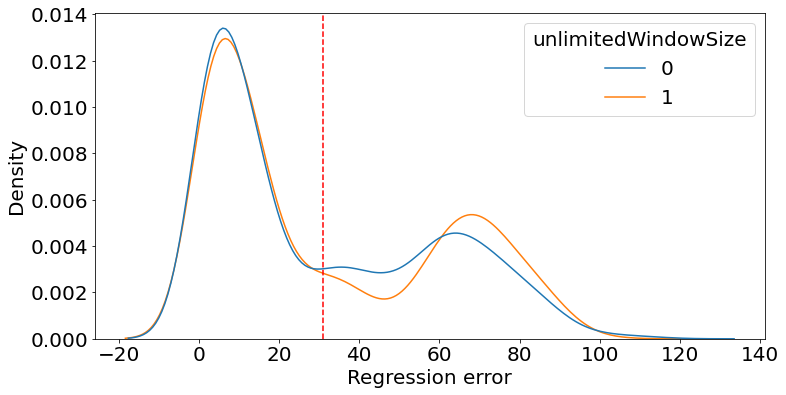

nginx


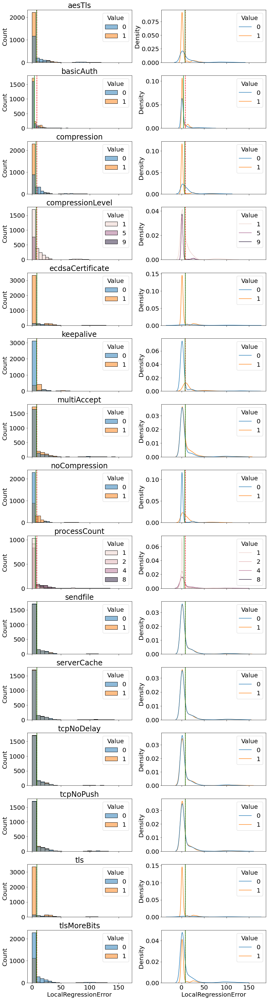

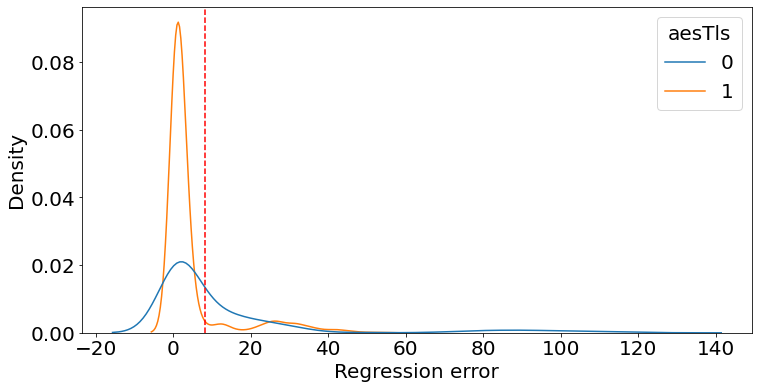

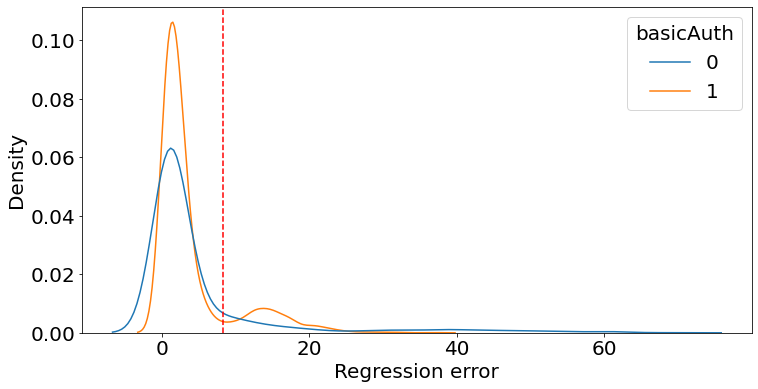

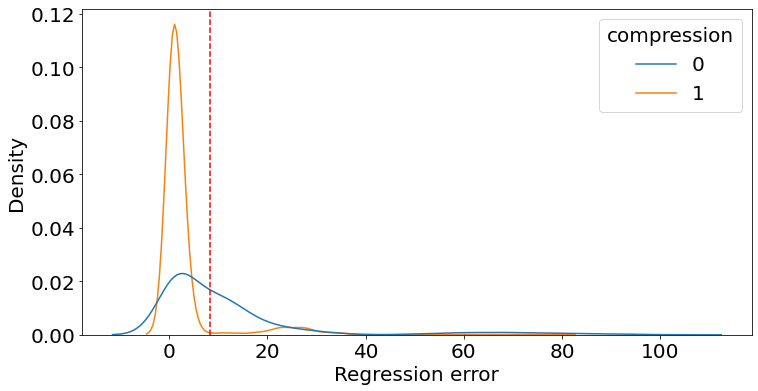

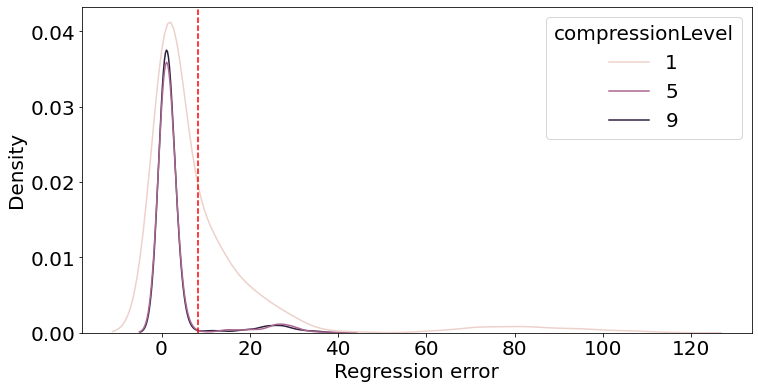

...

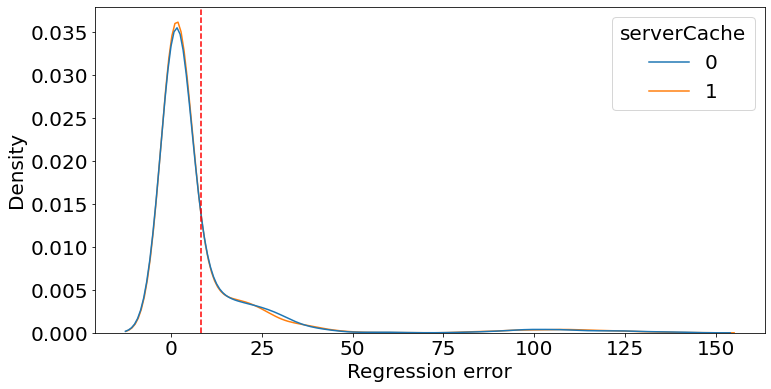

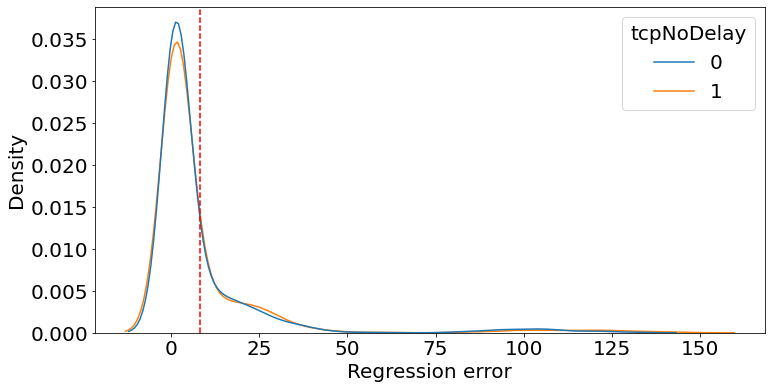

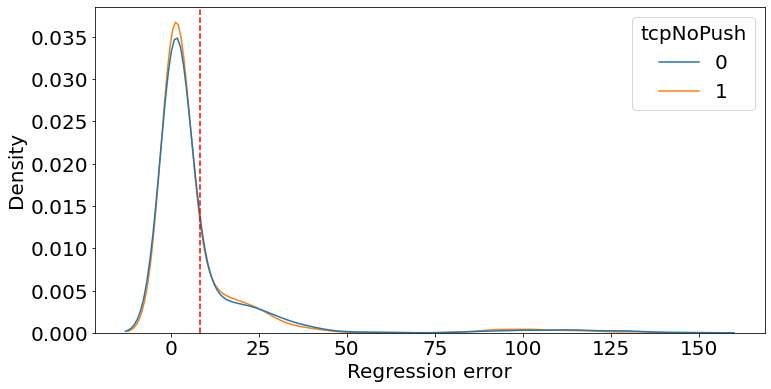

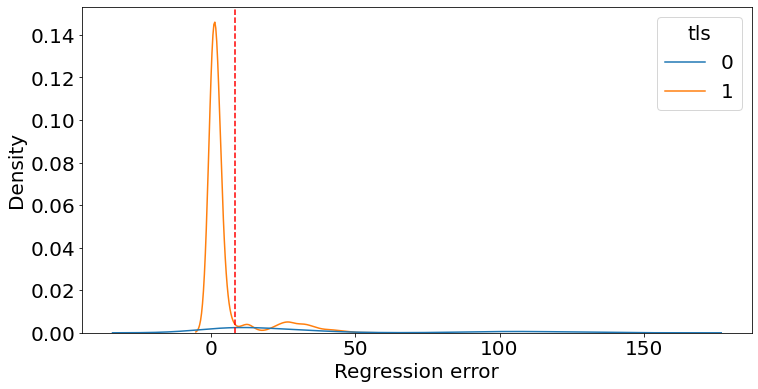

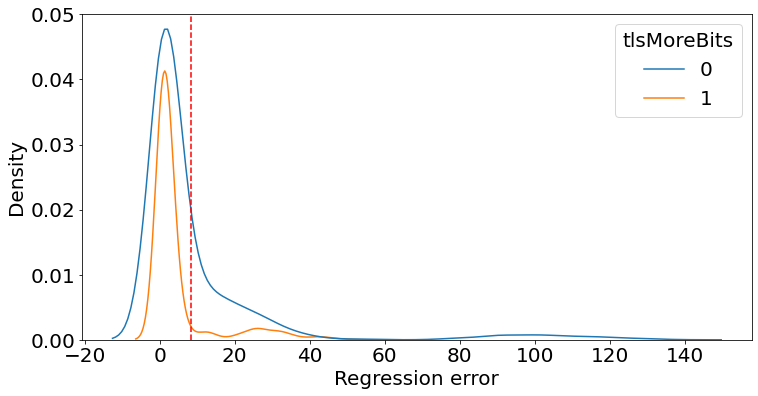

x264


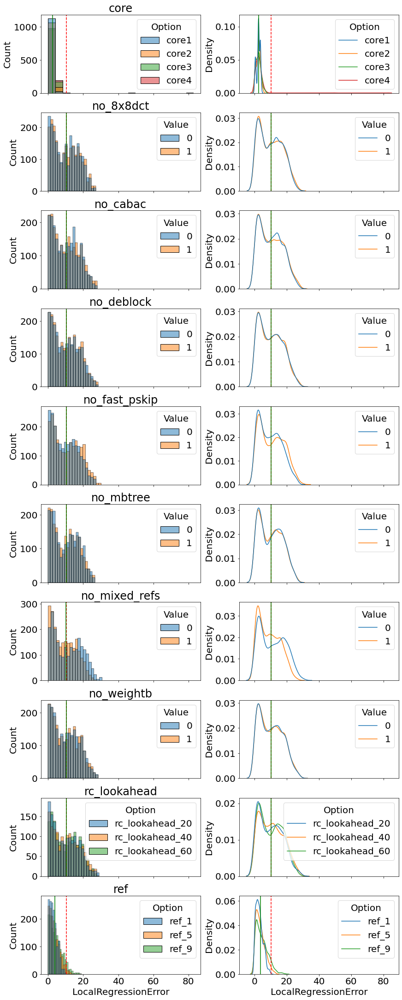

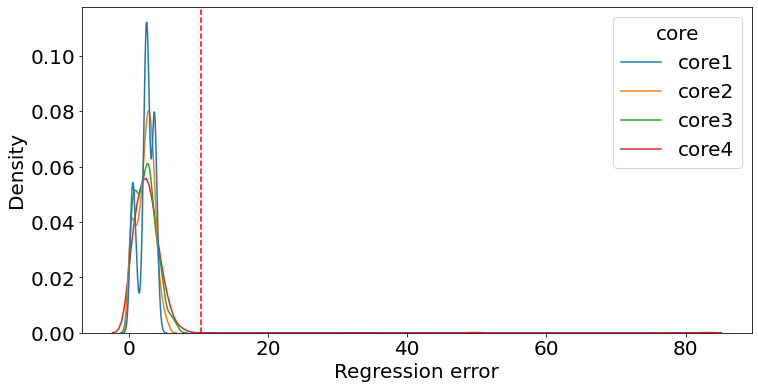

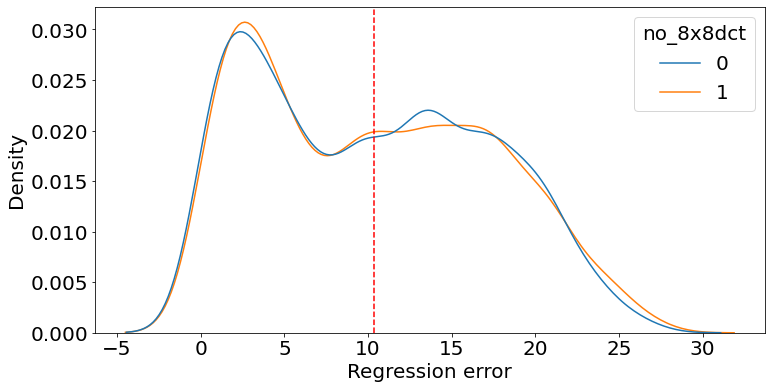

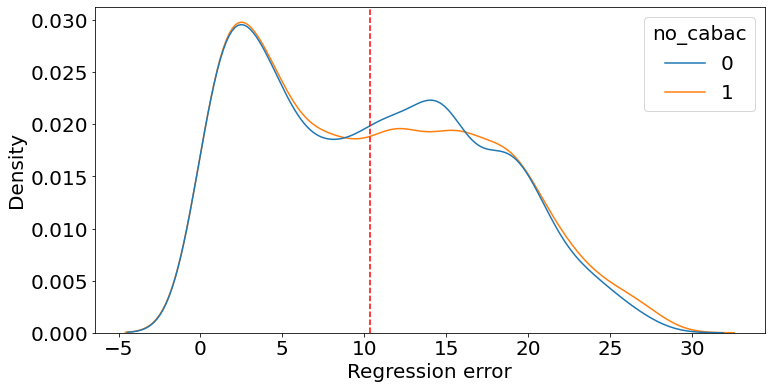

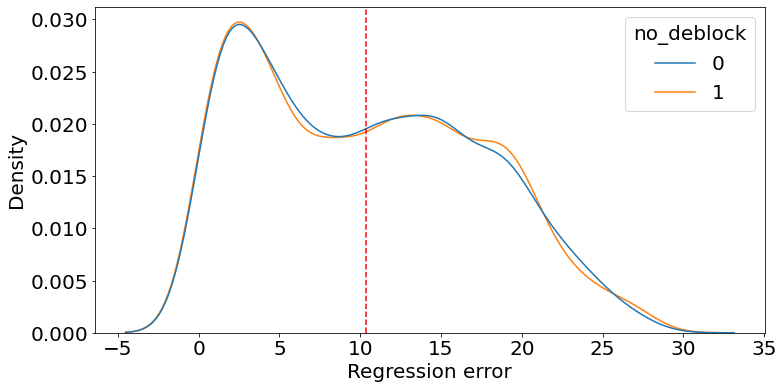

...

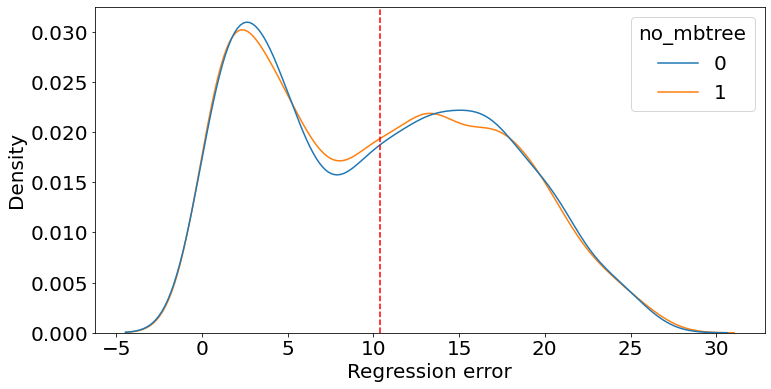

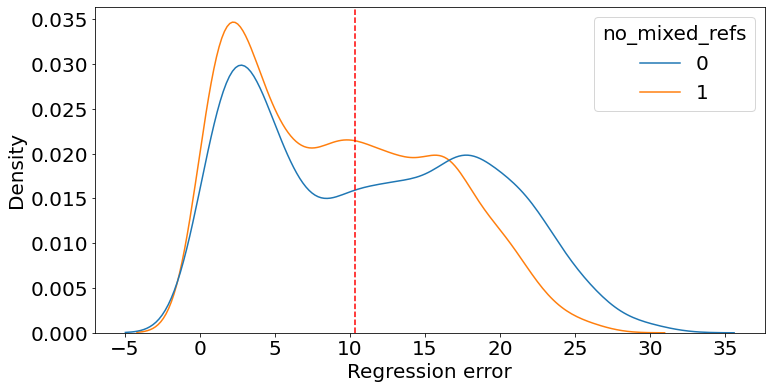

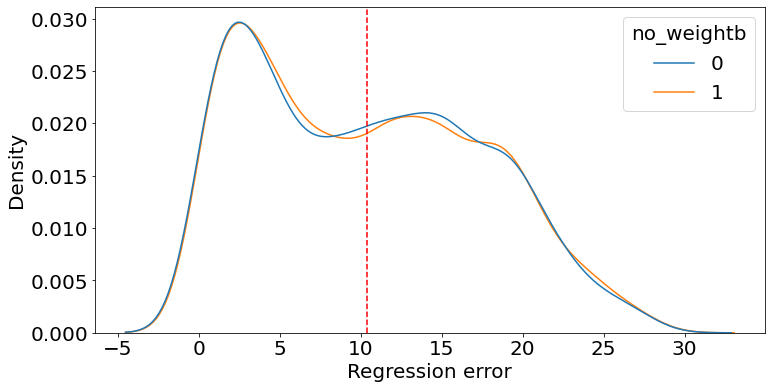

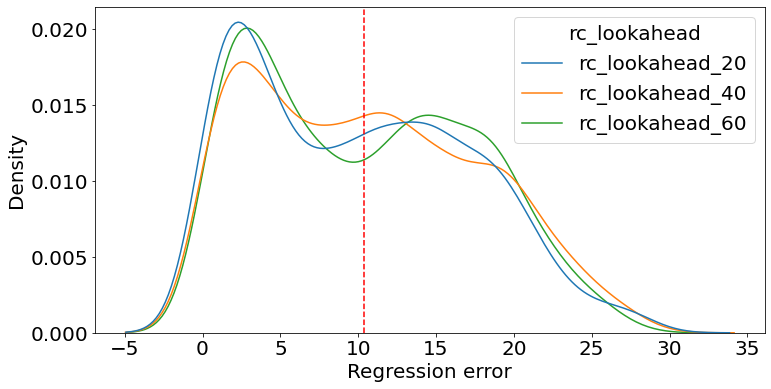

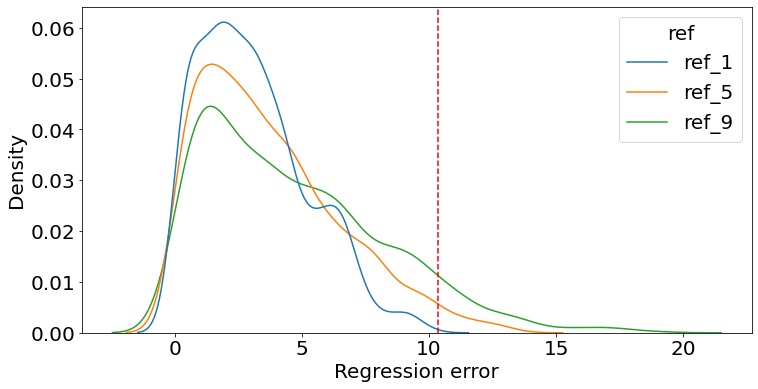

,CaseStudy,WindowMin,WindowMax,Option,Value,LocalRegressionErrorAbs,LocalRegressionError,GlobalRegressionErrorAbs,GlobalRegressionError,Group,ref
3453404,x264,-,-,ref_1,1,0.01,1.08,-,-,ref,ref_1
3453405,x264,-,-,ref_1,1,0.11,4.16,-,-,ref,ref_1
3453406,x264,-,-,ref_1,1,0.07,3.44,-,-,ref,ref_1
3453407,x264,-,-,ref_1,1,0.02,1.62,-,-,ref,ref_1
3453408,x264,-,-,ref_1,1,0.02,1.38,-,-,ref,ref_1
...,...,...,...,...,...,...,...,...,...,...,...
3458007,x264,-,-,ref_9,1,0.03,1.06,-,-,ref,ref_9
3458008,x264,-,-,ref_9,1,0.14,5.27,-,-,ref,ref_9
3458009,x264,-,-,ref_9,1,0.16,2.88,-,-,ref,ref_9
3458010,x264,-,-,ref_9,1,0.11,3.26,-,-,ref,ref_9


In [7]:
results = []
corr_res_cfg = []

rq1_error = {'brotli': 9.362309649338012, 
             'jump3r': 10.07376088427494, 
             'MongoDB': 1.6989472174721387, 
             'LLVM': 0.7970528135693291, 
             'x264': 10.360177309928984, 
             'kanzi': 70.43173695926725, 
             'PostgreSQL': 1.2976722566347876, 
             'nginx': 8.285394035654088, 
             'exastencils': 5.730121735854243, 
             '7z': 14.793548148470265, 
             'VP8': 22.056542234809573, 
             'Apache': 6.312060052327612, 
             'lrzip': 31.095766481514023, 
             'HSQLDB': 3.0880223980905885
            }

systems_to_show = ['7z', 'x264', 'LLVM', 'PostgreSQL', 'HSQLDB']

systems_fig_4 = ['kanzi', '7z']
systems_fig_4_arr = []

for study, df in df_error.groupby(['CaseStudy']):
    
    for option, sub_df in df.groupby(['Group']):
        color_column = 'Option' if len(sub_df.Option.unique()) > 1 else 'Value'
        for value, val_df in sub_df.groupby([color_column]):
            results.append([study, option, value, len(sub_df), val_df['LocalRegressionError'].mean(), 
                            val_df['LocalRegressionError'].std(), val_df['LocalRegressionError'].mean(), 
                            val_df['LocalRegressionError'].std()])
    
    print(study)
    if study in systems_fig_4:
        df['CaseStudy'] = study
        systems_fig_4_arr.append(df)
    
    if study not in systems_to_show:
        #continue
        pass
    
    rows = len(df.Group.unique())
    fig1, axes = plt.subplots(ncols=2, nrows=rows, constrained_layout=True, sharex='col',
                              figsize=(12,rows*3))
    
    import os
    if not os.path.exists('./../../RQ2/' + study + 
                '/LinRegError'):
        os.makedirs('./../../RQ2/' + study + 
                '/LinRegError')
    
    if not os.path.exists('./../../RQ2/' + study + 
                    '/OptionWiseLinearError'):
        os.makedirs('./../../RQ2/' + study + 
                    '/OptionWiseLinearError')

    for i, (option, sub_df) in enumerate(df.groupby(['Group'])):
        axes[i][0].set_title(option)
        
        color_column = 'Option' if len(sub_df.Option.unique()) > 1 else 'Value'
        
        sns.histplot(data=sub_df, x='LocalRegressionError', bins=20, hue=color_column, kde=False, ax=axes[i][0])
        axes[i][0].axvline(rq1_error.get(study), ls='--', color='r')
        axes[i][0].axvline(sub_df['LocalRegressionError'].mean(), ls='-', color='g')

        sns.kdeplot(data=sub_df, x='LocalRegressionError', hue=color_column, ax=axes[i][1])
        axes[i][1].axvline(rq1_error.get(study), ls='--', color='r')
        axes[i][1].axvline(sub_df['LocalRegressionError'].mean(), ls='-', color='g')
        
        del sub_df
        gc.collect()
        
    plt.savefig('./../../RQ2/' + study + 
                '/LinRegError/all_options.pdf')
    plt.savefig('./../../RQ2/' + study + 
                '/LinRegError/all_options.png')
    plt.show()
    plt.close()
    
    ids = {'Id':['jobs_1','jobs_4','jobs_8'],
           'City':['1','4','8']}
    ids = dict(zip(ids['Id'], ids['City']))
    
    for i, (option, sub_df) in enumerate(df.groupby(['Group'])):
        color_column = 'Option' if len(sub_df.Option.unique()) > 1 else 'Value'
        
        if option == 'jobs':
            newOption = 'Jobs'
        elif option == 'CompressionMethod':
            newOption = 'Compression method'
        else:
            newOption = option
        
        sub_df[newOption] = sub_df[color_column].replace(ids, regex=True)

        size = 20
        plt.rc('font', size=size)
        
        plt.figure(figsize=(12, 6))
        g = sns.kdeplot(data=sub_df, x='LocalRegressionError', hue=newOption)
        g.set(xlabel='Regression error')
        #g.legend(title=option, loc='upper left', labels=['Hell Yeh', 'Nah Bruh'])
        plt.axvline(rq1_error.get(study), ls='--', color='r')
        #print(color_column)
        #print(sub_df.loc[color_column])
        #plt.legend(title=option, loc='upper left', labels=['Hell Yeh', 'Nah Bruh'])
        #plt.title(study+' - '+option)
        
        plt.savefig('./../../RQ2/' + study + 
                    '/OptionWiseLinearError/' + study+'_'+option + '.pdf', bbox_inches='tight')
        plt.show()
        plt.close()
    
    
    del df
    gc.collect()
    #break
df_systems_fig_4 = pd.concat(systems_fig_4_arr)
sub_df

# Paper Table

In [8]:
rq1_error = {'brotli': 9.362309649338012, 
             'jump3r': 10.07376088427494, 
             'MongoDB': 1.6989472174721387, 
             'LLVM': 0.7970528135693291, 
             'x264': 10.360177309928984, 
             'kanzi': 70.43173695926725, 
             'PostgreSQL': 1.2976722566347876, 
             'nginx': 8.285394035654088, 
             'exastencils': 5.730121735854243, 
             '7z': 14.793548148470265, 
             'VP8': 22.056542234809573, 
             'Apache': 6.312060052327612, 
             'lrzip': 31.095766481514023, 
             'HSQLDB': 3.0880223980905885
            }

# Correlation Part
correlation_res_mean = []
for study, df in df_corr.groupby(['CaseStudy']):
    
    mask = df['WindowMin'] == '-'
    df_windows = df[~mask]
    df_all = df[mask]
    
    opt_whole_corr = []
    for option, sub_df in df_all.groupby(['Group']):        
        opt_whole_corr.append(sub_df['Pearson-Correlation'].mean())

    opt_whole_corr_df = pd.DataFrame(opt_whole_corr, columns=['corr'])
    
    opt_window_corr = []
    for option, sub_df in df_windows.groupby(['Group']):        
        opt_window_corr.append(sub_df['Pearson-Correlation'].tolist())
    opt_window_corr_out = []
    for l in opt_window_corr:
        opt_window_corr_out = opt_window_corr_out + l
    opt_window_corr_df = pd.DataFrame(opt_window_corr_out, columns=['corr'])
    
    
    correlation_res_mean.append([study, opt_whole_corr_df['corr'].mean()]+
                                list(opt_window_corr_df['corr'].value_counts(bins=bins, sort=False)))

# Regression Part
min_error_diff = 5
lin_model_res = []

for study, df in df_error.groupby(['CaseStudy']):
    regression_vals = []
    #print(study)
    count_err_diff = 0
    for i, (option, sub_df) in enumerate(df.groupby(['Group'])):
        if abs(sub_df['LocalRegressionError'].mean() - rq1_error.get(study)) > min_error_diff:
            count_err_diff += 1
        regression_vals.append(sub_df['LocalRegressionError'].mean())
    #print(regression_vals)
    #print()
    lin_model_res.append([study, min(regression_vals), max(regression_vals), 
                          np.mean(regression_vals), 
                          count_err_diff])
    #break
correlation_res_mean
lin_model_res

# 'System', 'Pearson', 'SN', 'MN', 'WN', 'MP', 'SP', 'MAPE', 'StD'
rq2_df = pd.merge(pd.DataFrame(correlation_res_mean, columns=['System', 'Pearson', 'SN', 'MN', 'WN', 'MP', 'SP']), 
                  pd.DataFrame(lin_model_res, columns=['System', 'Best', 'Worst', 'Mean', 'FW IO']), on='System')
rq2_df = rq2_df.rename(columns={"FW IO": "CO", "Best": "MAPE"})

rq2_df = rq2_df.sort_values(by=['System'], key=lambda col: col.str.lower())
rq2_df = rq2_df.round(3)
print(list(rq2_df))

['System', 'Pearson', 'SN', 'MN', 'WN', 'MP', 'SP', 'MAPE', 'Worst', 'Mean', 'CO']


In [9]:
rq2_df = rq2_df[['System', 'Pearson', 'SN', 'MN', 'WN', 'MP', 'SP', 'MAPE', 'CO']]
#print(list(rq2_df))

rq2_df['CI'] = [3, 0, 0, 0, 3, 0, 2, 0, 3, 3, 0, 0, 3, 5]
print(rq2_df.to_latex(index=False))

rq2_df.round(3)

\begin{tabular}{lrrrrrrrrr}
\toprule
     System &  Pearson &  SN &  MN &  WN &  MP &  SP &   MAPE &  CO &  CI \\
\midrule
         7z &    0.987 &  33 &   5 &  86 & 156 & 207 &  7.945 &   1 &   3 \\
     Apache &    0.816 &   0 &   0 &  39 &  30 &   0 &  1.549 &   0 &   0 \\
     brotli &    0.911 &   7 &   0 &   2 &  20 & 122 &  6.268 &   0 &   0 \\
exastencils &    0.912 &   1 &   1 &  16 & 178 & 478 &  5.548 &   0 &   0 \\
     HSQLDB &    0.971 &   1 &  15 &  77 &  42 &   9 &  2.853 &   0 &   3 \\
     jump3r &    0.989 &  16 &  18 &  29 &   6 & 114 &  4.510 &   2 &   0 \\
      kanzi &    0.965 &  12 &  13 &  50 &  42 & 117 & 23.707 &   4 &   2 \\
       LLVM &    0.996 &   0 &   0 &   8 &  15 & 572 &  0.789 &   0 &   0 \\
      lrzip &    0.987 &  11 &   2 &  40 &  48 &  87 &  7.164 &   1 &   3 \\
    MongoDB &    0.990 &  10 &   9 & 156 & 224 &  84 &  1.595 &   0 &   3 \\
      nginx &    0.997 &   0 &   0 &  36 &  35 &  73 &  4.391 &   0 &   0 \\
 PostgreSQL &    0.995 &   0 &

,System,Pearson,SN,MN,WN,MP,SP,MAPE,CO,CI
0,7z,0.987,33,5,86,156,207,7.945,1,3
1,Apache,0.816,0,0,39,30,0,1.549,0,0
7,brotli,0.911,7,0,2,20,122,6.268,0,0
8,exastencils,0.912,1,1,16,178,478,5.548,0,0
2,HSQLDB,0.971,1,15,77,42,9,2.853,0,3
9,jump3r,0.989,16,18,29,6,114,4.510,2,0
10,kanzi,0.965,12,13,50,42,117,23.707,4,2
3,LLVM,0.996,0,0,8,15,572,0.789,0,0
11,lrzip,0.987,11,2,40,48,87,7.164,1,3
4,MongoDB,0.990,10,9,156,224,84,1.595,0,3


# Mean of Performance / Energy Option-wise

In [10]:
df_stats = pd.read_csv(os.path.join(path, file_stat))

In [11]:
df_stats

,CaseStudy,WindowMin,WindowMax,Option,Value,Configurations,MeanPerf,MeanEnergy,StdPerf,StdEnergy,Group
0,7z,-,-,filterOff,0,34320,59.667421,2.036947,77.123932,2.518865,filterOff
1,7z,-,-,filterOff,1,34320,59.669788,2.037369,77.121580,2.519222,filterOff
2,7z,4.2,46.2,filterOff,0,20396,16.787648,0.606571,10.387445,0.394521,filterOff
3,7z,4.2,46.2,filterOff,1,20396,16.788381,0.606885,10.384371,0.393788,filterOff
4,7z,25.2,67.3,filterOff,0,6332,43.092038,1.492217,5.743497,0.318200,filterOff
...,...,...,...,...,...,...,...,...,...,...,...
525,7z,235.4,277.4,x,10,184,270.935707,10.083148,4.355441,0.138807,x
526,7z,256.4,298.5,x,10,386,285.081845,9.767613,13.851851,0.323714,x
527,7z,277.4,319.5,x,10,2288,300.364282,9.551791,1.429665,0.111103,x
528,7z,298.5,340.5,x,10,2086,300.596383,9.558724,1.269895,0.110118,x


In [12]:
print(rq2_df.to_latex(index=False))

rq2_df.round(3)

\begin{tabular}{lrrrrrrrrr}
\toprule
     System &  Pearson &  SN &  MN &  WN &  MP &  SP &   MAPE &  CO &  CI \\
\midrule
         7z &    0.987 &  33 &   5 &  86 & 156 & 207 &  7.945 &   1 &   3 \\
     Apache &    0.816 &   0 &   0 &  39 &  30 &   0 &  1.549 &   0 &   0 \\
     brotli &    0.911 &   7 &   0 &   2 &  20 & 122 &  6.268 &   0 &   0 \\
exastencils &    0.912 &   1 &   1 &  16 & 178 & 478 &  5.548 &   0 &   0 \\
     HSQLDB &    0.971 &   1 &  15 &  77 &  42 &   9 &  2.853 &   0 &   3 \\
     jump3r &    0.989 &  16 &  18 &  29 &   6 & 114 &  4.510 &   2 &   0 \\
      kanzi &    0.965 &  12 &  13 &  50 &  42 & 117 & 23.707 &   4 &   2 \\
       LLVM &    0.996 &   0 &   0 &   8 &  15 & 572 &  0.789 &   0 &   0 \\
      lrzip &    0.987 &  11 &   2 &  40 &  48 &  87 &  7.164 &   1 &   3 \\
    MongoDB &    0.990 &  10 &   9 & 156 & 224 &  84 &  1.595 &   0 &   3 \\
      nginx &    0.997 &   0 &   0 &  36 &  35 &  73 &  4.391 &   0 &   0 \\
 PostgreSQL &    0.995 &   0 &

,System,Pearson,SN,MN,WN,MP,SP,MAPE,CO,CI
0,7z,0.987,33,5,86,156,207,7.945,1,3
1,Apache,0.816,0,0,39,30,0,1.549,0,0
7,brotli,0.911,7,0,2,20,122,6.268,0,0
8,exastencils,0.912,1,1,16,178,478,5.548,0,0
2,HSQLDB,0.971,1,15,77,42,9,2.853,0,3
9,jump3r,0.989,16,18,29,6,114,4.510,2,0
10,kanzi,0.965,12,13,50,42,117,23.707,4,2
3,LLVM,0.996,0,0,8,15,572,0.789,0,0
11,lrzip,0.987,11,2,40,48,87,7.164,1,3
4,MongoDB,0.990,10,9,156,224,84,1.595,0,3


In [13]:
df

,CaseStudy,WindowMin,WindowMax,Option,Value,LocalRegressionErrorAbs,LocalRegressionError,GlobalRegressionErrorAbs,GlobalRegressionError,Group
3416540,x264,-,-,no_8x8dct,0,0.23,17.00,-,-,no_8x8dct
3416541,x264,-,-,no_8x8dct,0,0.32,10.34,-,-,no_8x8dct
3416542,x264,-,-,no_8x8dct,0,0.19,9.19,-,-,no_8x8dct
3416543,x264,-,-,no_8x8dct,0,0.22,13.74,-,-,no_8x8dct
3416544,x264,-,-,no_8x8dct,0,0.16,8.24,-,-,no_8x8dct
...,...,...,...,...,...,...,...,...,...,...
3462615,x264,-,-,core4,1,0.12,5.75,-,-,core
3462616,x264,-,-,core4,1,0.00,0.10,-,-,core
3462617,x264,-,-,core4,1,0.07,5.40,-,-,core
3462618,x264,-,-,core4,1,0.02,0.96,-,-,core


In [14]:
rq1_errors = [14.7, 6.3, 9.3, 5.7, 3.0, 10.0, 70.4, 0.7, 31.0, 1.6, 8.2, 1.2, 22.0, 10.3]
rq2_errors = [7.9,  4.0, 6.2, 5.5, 2.8, 4.5,  23.7, 0.7, 7.1,  1.5, 4.3, 1.2, 4.7,  2.5]
error_reduction = []
for rq1, rq2 in zip(rq1_errors,rq2_errors):
    #print(rq1, ' - ', rq2 )
    #print(rq1-rq2)
    error_reduction.append(rq1-rq2)
sorted(error_reduction)

[0.0,
 0.0,
 0.10000000000000009,
 0.20000000000000018,
 0.20000000000000018,
 2.3,
 3.1000000000000005,
 3.8999999999999995,
 5.5,
 6.799999999999999,
 7.800000000000001,
 17.3,
 23.9,
 46.7]

# Combination of figure 4 and 5

In [15]:
df_systems_fig_4

,CaseStudy,WindowMin,WindowMax,Option,Value,LocalRegressionErrorAbs,LocalRegressionError,GlobalRegressionErrorAbs,GlobalRegressionError,Group
0,7z,-,-,filterOff,0,0.11,19.12,-,-,filterOff
1,7z,-,-,filterOff,0,0.11,19.39,-,-,filterOff
2,7z,-,-,filterOff,0,0.09,15.48,-,-,filterOff
3,7z,-,-,filterOff,0,0.12,21.46,-,-,filterOff
4,7z,-,-,filterOff,0,0.09,15.37,-,-,filterOff
...,...,...,...,...,...,...,...,...,...,...
1716647,kanzi,-,-,TPAQX,1,54.95,44.55,-,-,entropy
1716648,kanzi,-,-,TPAQX,1,68.63,45.02,-,-,entropy
1716649,kanzi,-,-,TPAQX,1,3.58,67.47,-,-,entropy
1716650,kanzi,-,-,TPAQX,1,49.93,47.30,-,-,entropy


7z


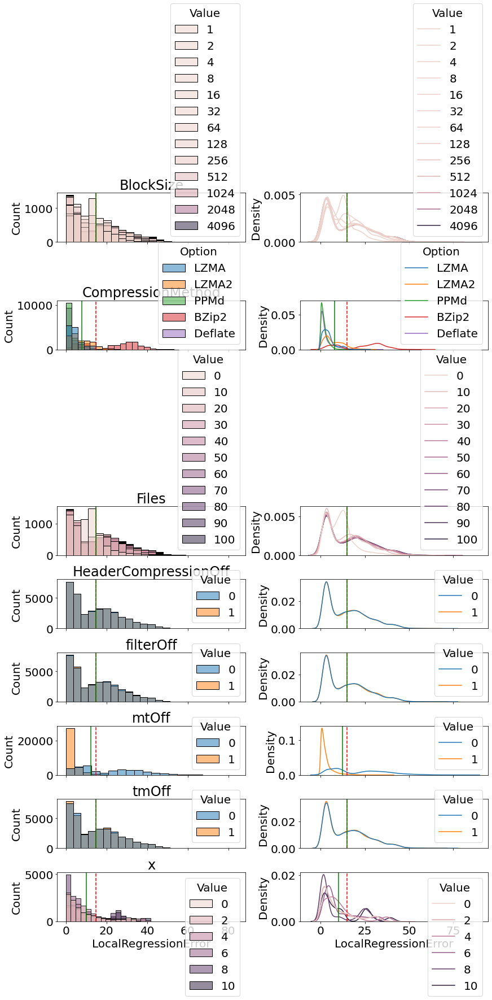

kanzi


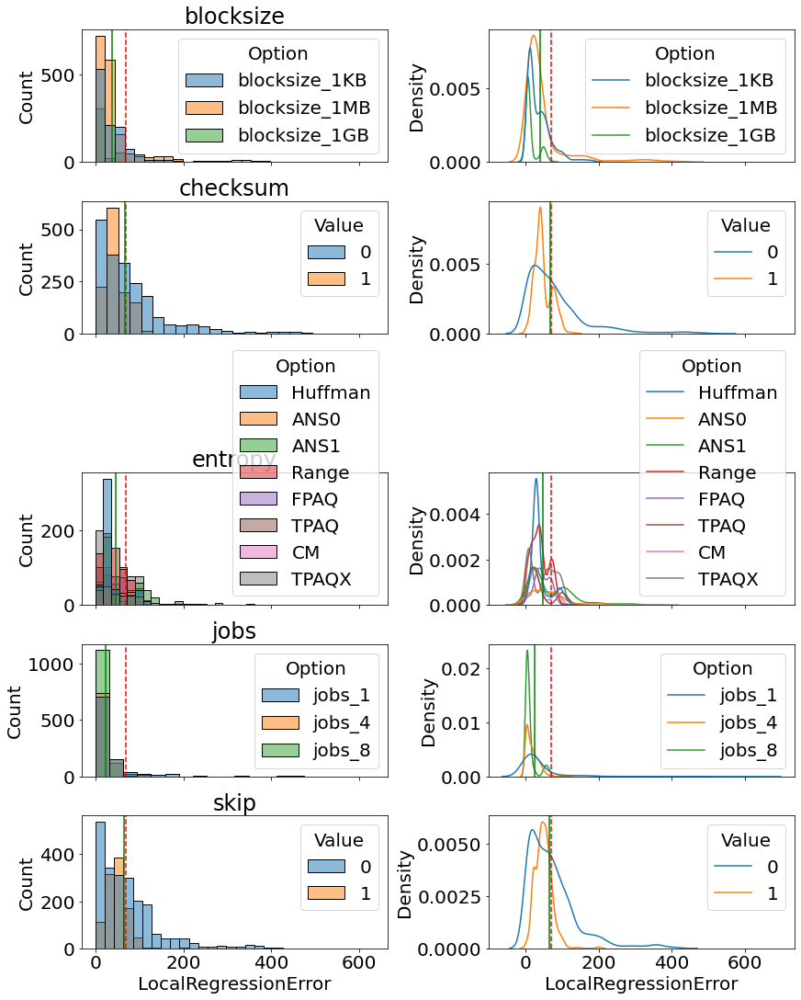

In [16]:
for study, df in df_systems_fig_4.groupby(['CaseStudy']):
    print(study)
    rows = len(df.Group.unique())
    fig1, axes = plt.subplots(ncols=2, nrows=rows, constrained_layout=True, sharex='col',
                              figsize=(12,rows*3))
    
    for i, (option, sub_df) in enumerate(df.groupby(['Group'])):
        axes[i][0].set_title(option)
        
        color_column = 'Option' if len(sub_df.Option.unique()) > 1 else 'Value'
        
        sns.histplot(data=sub_df, x='LocalRegressionError', bins=20, hue=color_column, kde=False, ax=axes[i][0])
        axes[i][0].axvline(rq1_error.get(study), ls='--', color='r')
        axes[i][0].axvline(sub_df['LocalRegressionError'].mean(), ls='-', color='g')

        sns.kdeplot(data=sub_df, x='LocalRegressionError', hue=color_column, ax=axes[i][1])
        axes[i][1].axvline(rq1_error.get(study), ls='--', color='r')
        axes[i][1].axvline(sub_df['LocalRegressionError'].mean(), ls='-', color='g')
        
        del sub_df
        gc.collect()
        
    #plt.savefig('/home/mweber/git/performance-energy-correlation-code/out/RQ2/' + study + 
    #            '/LinRegError/all_options.pdf')
    #plt.savefig('/home/mweber/git/performance-energy-correlation-code/out/RQ2/' + study + 
    #            '/LinRegError/all_options.png')
    plt.show()
    plt.close()

In [17]:
path_7z = './../../data/7z/measurements.csv'
path_kanzi = './../../data/kanzi/measurements.csv'

df_7z = pd.read_csv(path_7z, sep=';')
df_7z
df_kanzi = pd.read_csv(path_kanzi, sep=';')

print(list(df_kanzi), list(df_7z))

df_7z_arr = []
for index, row in df_7z.iterrows():
    # 'jobs_8', 'jobs_1', 'jobs_4'
    #print(row['LZMA'],row['LZMA2'],row['PPMd'],row['BZip2'],row['Deflate'])
    if row['LZMA']:
        df_7z_arr.append(['7z', 'LZMA', row['energy'], row['performance']])
    if row['LZMA2']:
        df_7z_arr.append(['7z', 'LZMA2', row['energy'], row['performance']])
    if row['PPMd']:
        df_7z_arr.append(['7z', 'PPMd', row['energy'], row['performance']])
    if row['BZip2']:
        df_7z_arr.append(['7z', 'BZip2', row['energy'], row['performance']])
    if row['Deflate']:
        df_7z_arr.append(['7z', 'Deflate', row['energy'], row['performance']])
    
df_7z = pd.DataFrame(data=df_7z_arr, columns=['CaseStudy', 'CompressionMethod', 'energy', 'performance'])
df_7z['energy'] = df_7z['energy']/1000
df_7z['performance'] = df_7z['performance']/1000

df_kanzi_arr = []
for index, row in df_kanzi.iterrows():
    # 'jobs_8', 'jobs_1', 'jobs_4'
    if row['jobs_8']:
        df_kanzi_arr.append(['kanzi', 8, row['energy'], row['performance']])
    if row['jobs_1']:
        df_kanzi_arr.append(['kanzi', 1, row['energy'], row['performance']])
    if row['jobs_4']:
        df_kanzi_arr.append(['kanzi', 4, row['energy'], row['performance']])
    
df_kanzi = pd.DataFrame(data=df_kanzi_arr, columns=['CaseStudy', 'Jobs', 'energy', 'performance'])
df_kanzi['energy'] = df_kanzi['energy']/1000


df_kanzi

['workload', 'root', 'LZP', 'ROLZX', 'RANK', 'TEXT', 'skip', 'TPAQ', 'BWTS', 'LZ', 'blocksize_1MB', 'MTFT', 'blocksize_1KB', 'entropy', 'SRT', 'X86', 'checksum', 'FPAQ', 'RLT', 'BWT', 'blocksize_1GB', 'jobs_8', 'jobs_1', 'jobs_4', 'TPAQX', 'CM', 'ZRLT', 'Range', 'ROLZ', 'ANS0', 'ANS1', 'Huffman', 'energy', 'performance'] ['root', 'filterOff', 'HeaderCompressionOff', 'mtOff', 'CompressionMethod', 'LZMA', 'LZMA2', 'PPMd', 'BZip2', 'Deflate', 'tmOff', 'Files', 'BlockSize', 'x', 'energy', 'performance']


,CaseStudy,Jobs,energy,performance
0,kanzi,8,3.364003,66.722
1,kanzi,4,0.652013,18.090
2,kanzi,1,0.734160,33.414
3,kanzi,8,3.684926,68.982
4,kanzi,4,2.246349,56.166
...,...,...,...,...
3197,kanzi,8,1.246370,38.008
3198,kanzi,8,23.742069,464.546
3199,kanzi,1,1.706099,83.276
3200,kanzi,8,1.582359,28.054


In [18]:
dist_data_7z = df_systems_fig_4[(df_systems_fig_4['CaseStudy']=='7z') & (df_systems_fig_4['Group']=='CompressionMethod')]

dist_data_kanzi = df_systems_fig_4[(df_systems_fig_4['CaseStudy']=='kanzi') & (df_systems_fig_4['Group']=='jobs')]

rq1_error = {'brotli': 9.362309649338012, 
             'jump3r': 10.07376088427494, 
             'MongoDB': 1.6989472174721387, 
             'LLVM': 0.7970528135693291, 
             'x264': 10.360177309928984, 
             'kanzi': 70.43173695926725, 
             'PostgreSQL': 1.2976722566347876, 
             'nginx': 8.285394035654088, 
             'exastencils': 5.730121735854243, 
             '7z': 14.793548148470265, 
             'VP8': 22.056542234809573, 
             'Apache': 6.312060052327612, 
             'lrzip': 31.095766481514023, 
             'HSQLDB': 3.0880223980905885
            }

dist_data_7z
dist_data_kanzi

,CaseStudy,WindowMin,WindowMax,Option,Value,LocalRegressionErrorAbs,LocalRegressionError,GlobalRegressionErrorAbs,GlobalRegressionError,Group
1710248,kanzi,-,-,jobs_1,1,1.21,164.49,-,-,jobs
1710249,kanzi,-,-,jobs_1,1,0.73,2.04,-,-,jobs
1710250,kanzi,-,-,jobs_1,1,2.07,28.05,-,-,jobs
1710251,kanzi,-,-,jobs_1,1,0.79,56.86,-,-,jobs
1710252,kanzi,-,-,jobs_1,1,2.78,39.50,-,-,jobs
...,...,...,...,...,...,...,...,...,...,...
1713445,kanzi,-,-,jobs_8,1,0.05,2.40,-,-,jobs
1713446,kanzi,-,-,jobs_8,1,0.02,1.68,-,-,jobs
1713447,kanzi,-,-,jobs_8,1,0.79,63.21,-,-,jobs
1713448,kanzi,-,-,jobs_8,1,0.72,3.04,-,-,jobs


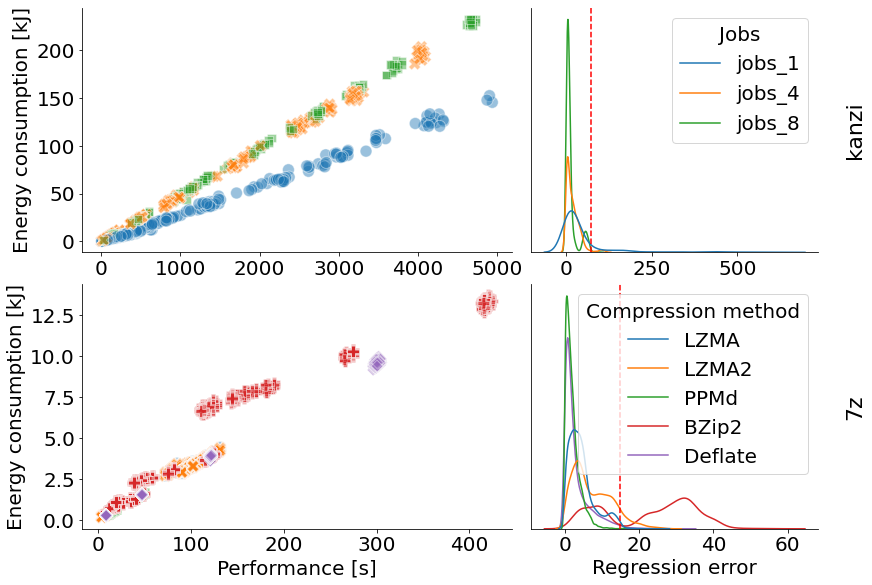

In [36]:

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12,8), constrained_layout=True, sharex=False, gridspec_kw={'width_ratios': [3, 2]})

custom_pal = sns.color_palette('Accent')

sns.scatterplot(data=df_kanzi, x='performance', y='energy', palette='tab10', hue='Jobs', alpha=.45, s=140, style='Jobs', ax=axes[0,0])
sns.scatterplot(data=df_7z, x='performance', y='energy', palette='tab10', hue='CompressionMethod', alpha=.45, s=140, style='CompressionMethod',ax=axes[1,0])


g1= sns.kdeplot(data=dist_data_kanzi, x='LocalRegressionError', palette='tab10', hue='Option', ax=axes[0,1])
g2 = sns.kdeplot(data=dist_data_7z, x='LocalRegressionError', palette='tab10', hue='Option', ax=axes[1,1])

axes[0,1].axvline(70.43, ls='--', color='r')
axes[1,1].axvline(14.79, ls='--', color='r')

axes[0,0].get_legend().remove()
axes[1,0].get_legend().remove()

axes[0,0].set_xlabel('')
axes[0,1].set_xlabel('')

axes[1,0].set_xlabel('Performance [s]')
axes[1,1].set_xlabel('Regression error')

axes[0,0].set_ylabel('Energy consumption [kJ]')
axes[1,0].set_ylabel('Energy consumption [kJ]')

axes[0,1].set_yticks([])
axes[1,1].set_yticks([])


axes[0,1].yaxis.set_label_position("right")
axes[0,1].yaxis.tick_right()
axes[0,1].set_ylabel('\nkanzi', fontsize=22)

axes[1,1].yaxis.set_label_position("right")
axes[1,1].yaxis.tick_right()
axes[1,1].set_ylabel('\n7z', fontsize=22)

g1.legend_.set_title("Jobs")
g2.legend_.set_title("Compression method")

sns.despine()

plt.savefig('./../../RQ2/example.pdf')
plt.savefig('./../../RQ2/example.png', dpi=200)
plt.show()


In [35]:
sns.color_palette('Accent')


[(0.4980392156862745, 0.788235294117647, 0.4980392156862745),
 (0.7450980392156863, 0.6823529411764706, 0.8313725490196079),
 (0.9921568627450981, 0.7529411764705882, 0.5254901960784314),
 (1.0, 1.0, 0.6),
 (0.2196078431372549, 0.4235294117647059, 0.6901960784313725),
 (0.9411764705882353, 0.00784313725490196, 0.4980392156862745),
 (0.7490196078431373, 0.3568627450980392, 0.09019607843137253),
 (0.4, 0.4, 0.4)]